# Exploração

Primeiras 5 linhas da base_treino:
  material_embalagem faixa_tamanho embalagem mes_ano   ano  mes  semana  \
0                LT.  251 A 299 ML     DESC.  2022-1  2022    1      52   
1                LT.  350 A 400 ML     DESC.  2022-1  2022    1      52   
2                LT.  451 A 499 ML     DESC.  2022-1  2022    1      52   
3                 V.  350 A 400 ML     DESC.  2022-1  2022    1      52   
4                LT.  350 A 400 ML     DESC.  2022-1  2022    1      52   

  dt_completa                                   tag_mkt     geo  ...  \
0  2022-01-02  M000000000010002331200000000000020140127  GEO NO  ...   
1  2022-01-02  M000000000010002331200000000000020140127  GEO NO  ...   
2  2022-01-02  M000000000010002331200000000000020140127  GEO NO  ...   
3  2022-01-02  M000000000010002331200000000000020140127  GEO NO  ...   
4  2022-01-02  M000000000010002331200000000000020140127  GEO NO  ...   

  volume_total vendas_normalizada_in_hl vendas_valor_normalizada_in_hl trend  \
0

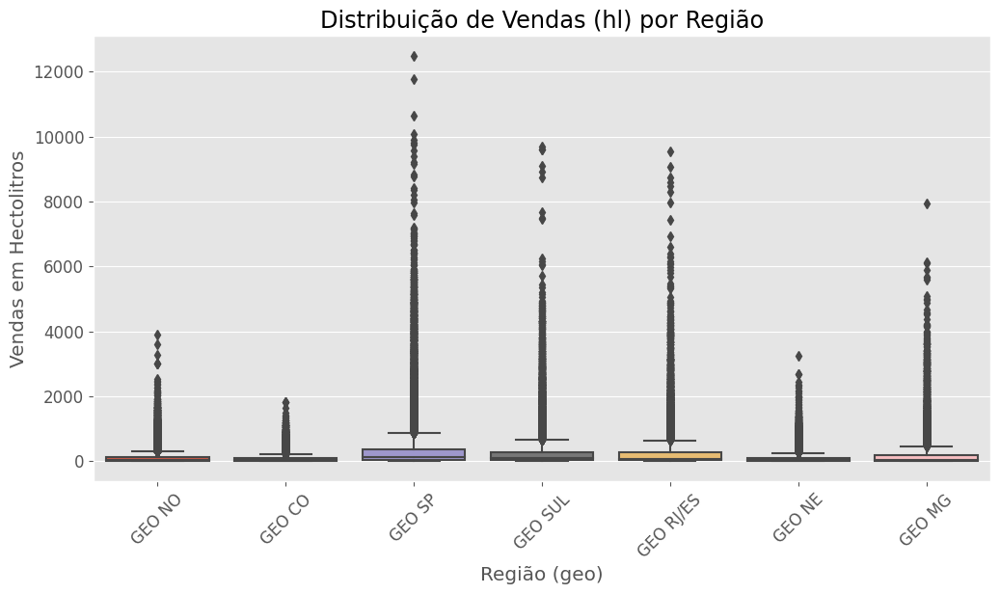

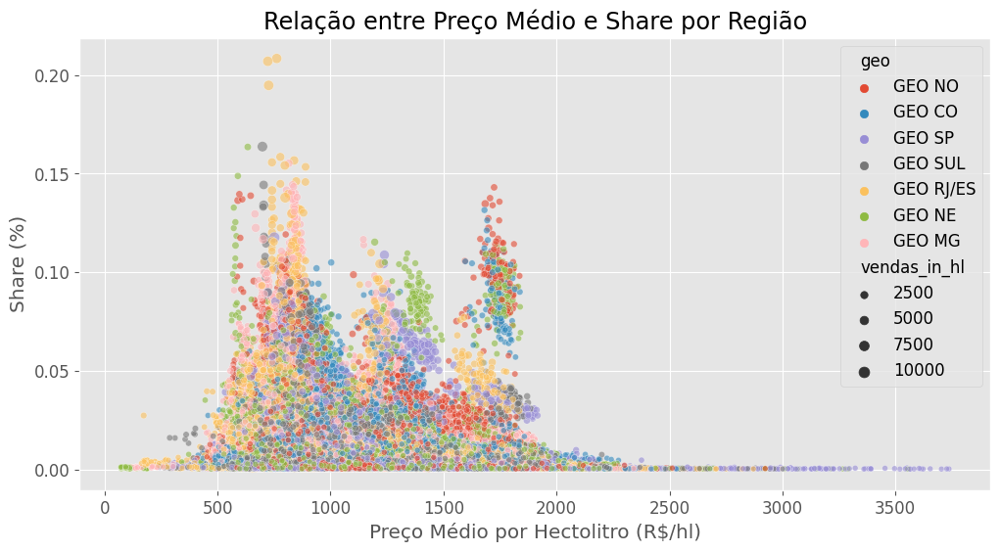

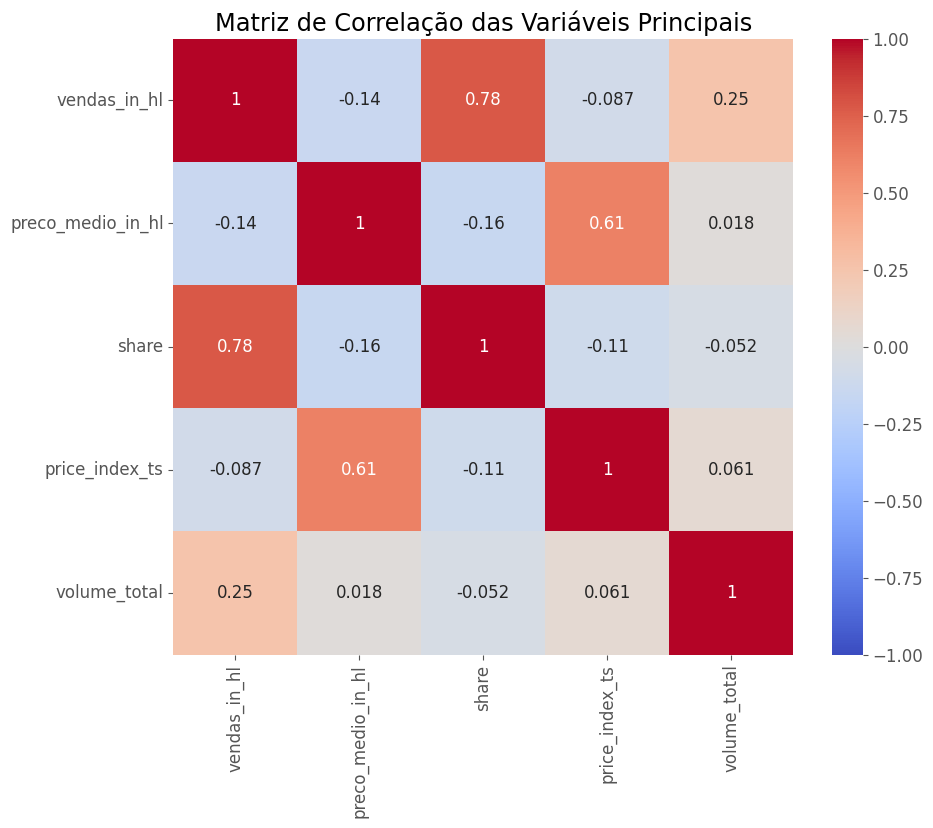

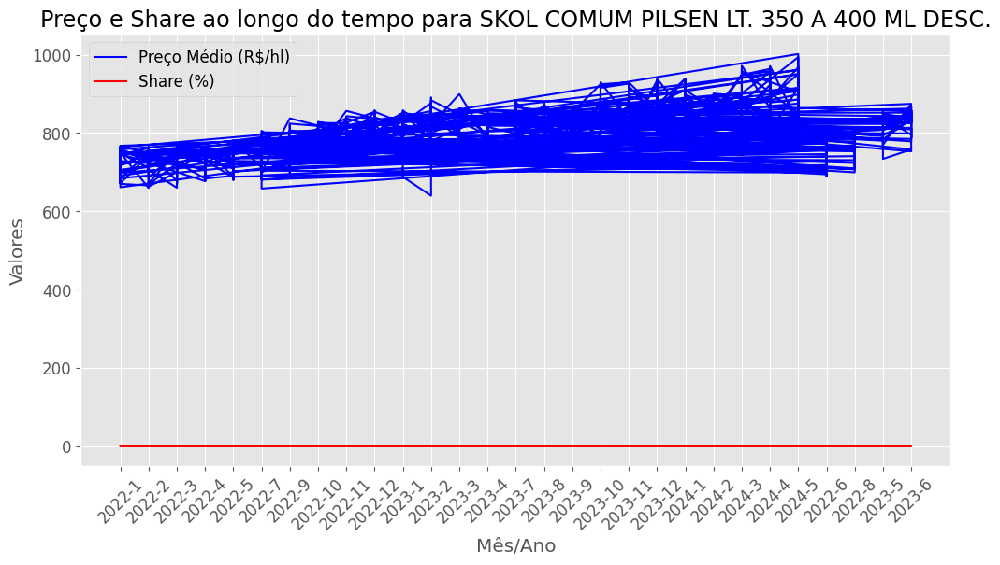

In [3]:
# Imports
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Configurações
pd.set_option('display.float_format', lambda x: '%.3f' % x)
plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (20, 5)
plt.rcParams['font.size'] = 12
plt.rcParams['figure.titlesize'] = 20

# Função para exibir dimensões (adaptada do código do seu amigo)
def df_shape(df):
    print('Número de linhas: {:,}'.format(df.shape[0]))
    print('Número de colunas: {:,}'.format(df.shape[1]))
    return None

# Carregar a base de treino
df_raw = pd.read_excel('/kaggle/input/data-elasticidade/base_treino.xlsx')
df = df_raw.copy()

# 1. Visualizar as primeiras linhas
print("Primeiras 5 linhas da base_treino:")
print(df.head())

# 2. Dimensões da base
print("\nDimensões da base_treino:")
df_shape(df)

# 3. Listar colunas
print("\nColunas disponíveis:")
print(df.columns.to_list())

# 4. Tipos de dados
print("\nTipos de dados por coluna:")
df.info()

# 5. Estatísticas descritivas das variáveis principais
print("\nEstatísticas descritivas das variáveis principais:")
key_columns = ['vendas_in_hl', 'preco_medio_in_hl', 'share', 'price_index_ts', 'volume_total']
desc = df[key_columns].describe()
print(desc)

# 6. Verificar valores nulos
print("\nValores nulos por coluna:")
null_counts = df.isnull().sum()
print(null_counts[null_counts > 0])  # Mostra apenas colunas com nulos

# 7. Distribuição de vendas por região (geo)
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='geo', y='vendas_in_hl')
plt.title('Distribuição de Vendas (hl) por Região')
plt.xlabel('Região (geo)')
plt.ylabel('Vendas em Hectolitros')
plt.xticks(rotation=45)
plt.show()

# 8. Relação entre preço e share por região
plt.figure(figsize=(12, 6))
sns.scatterplot(data=df, x='preco_medio_in_hl', y='share', hue='geo', size='vendas_in_hl', alpha=0.6)
plt.title('Relação entre Preço Médio e Share por Região')
plt.xlabel('Preço Médio por Hectolitro (R$/hl)')
plt.ylabel('Share (%)')
plt.show()

# 9. Correlação entre variáveis numéricas
plt.figure(figsize=(10, 8))
corr = df[key_columns].corr()
sns.heatmap(corr, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Matriz de Correlação das Variáveis Principais')
plt.show()

# 10. Variação de preço e share ao longo do tempo (exemplo por produto)
example_product = df['long_prod'].value_counts().index[0]  # Produto mais frequente
df_product = df[df['long_prod'] == example_product]
plt.figure(figsize=(12, 6))
plt.plot(df_product['mes_ano'], df_product['preco_medio_in_hl'], label='Preço Médio (R$/hl)', color='blue')
plt.plot(df_product['mes_ano'], df_product['share'], label='Share (%)', color='red')
plt.title(f'Preço e Share ao longo do tempo para {example_product}')
plt.xlabel('Mês/Ano')
plt.ylabel('Valores')
plt.legend()
plt.xticks(rotation=45)
plt.show()

Carregando base de treino: /kaggle/input/data-elasticidade/base_treino.xlsx

=== Análise da Base de Treino ===

Distribuição de dados no dataset Treino:
Total de registros: 114,124
Número de regiões: 7

Estatísticas detalhadas por região:
Região  Quantidade  Percentual        min        max  nunique  Período
   SUL       20175      17.680 2022-01-02 2024-05-26      126      875
    SP       19314      16.920 2022-01-02 2024-05-26      126      875
    MG       16099      14.110 2022-01-02 2024-05-26      126      875
 RJ/ES       15478      13.560 2022-01-02 2024-05-26      126      875
    CO       15426      13.520 2022-01-02 2024-05-26      126      875
    NE       14159      12.410 2022-01-02 2024-05-26      126      875
    NO       13473      11.810 2022-01-02 2024-05-26      126      875


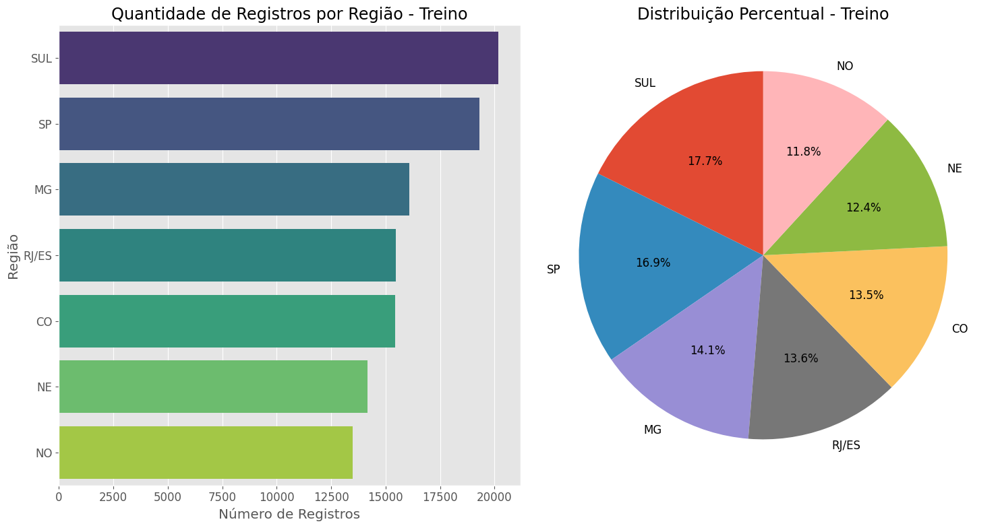

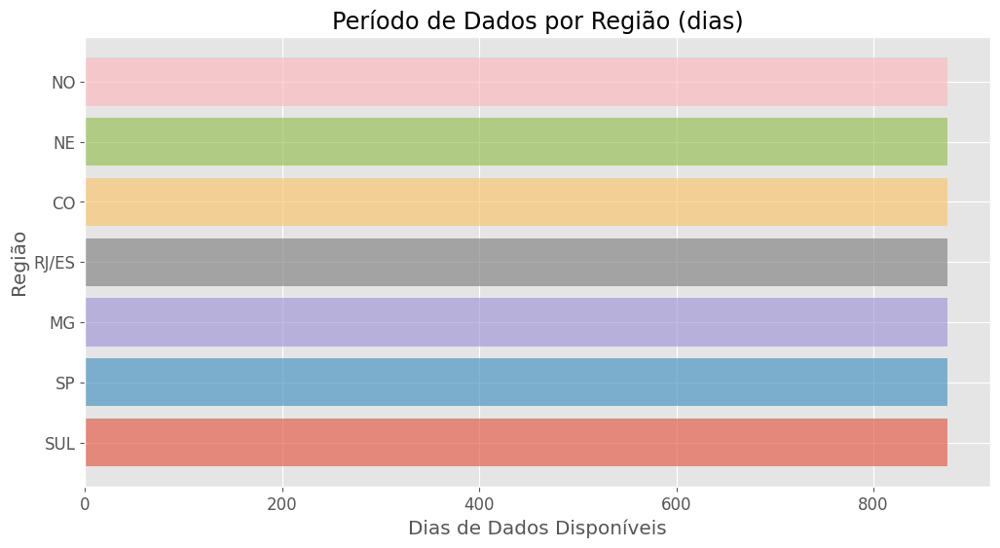


Carregando base de teste: /kaggle/input/data-elasticidade/base_teste.xlsx

=== Análise da Base de Teste ===

Distribuição de dados no dataset Teste:
Total de registros: 3,584
Número de regiões: 7

Estatísticas detalhadas por região:
Região  Quantidade  Percentual        min        max  nunique  Período
   SUL         649      18.110 2024-06-02 2024-06-23        4       21
    SP         598      16.690 2024-06-02 2024-06-23        4       21
    MG         494      13.780 2024-06-02 2024-06-23        4       21
    CO         490      13.670 2024-06-02 2024-06-23        4       21
 RJ/ES         477      13.310 2024-06-02 2024-06-23        4       21
    NO         444      12.390 2024-06-02 2024-06-23        4       21
    NE         432      12.050 2024-06-02 2024-06-23        4       21


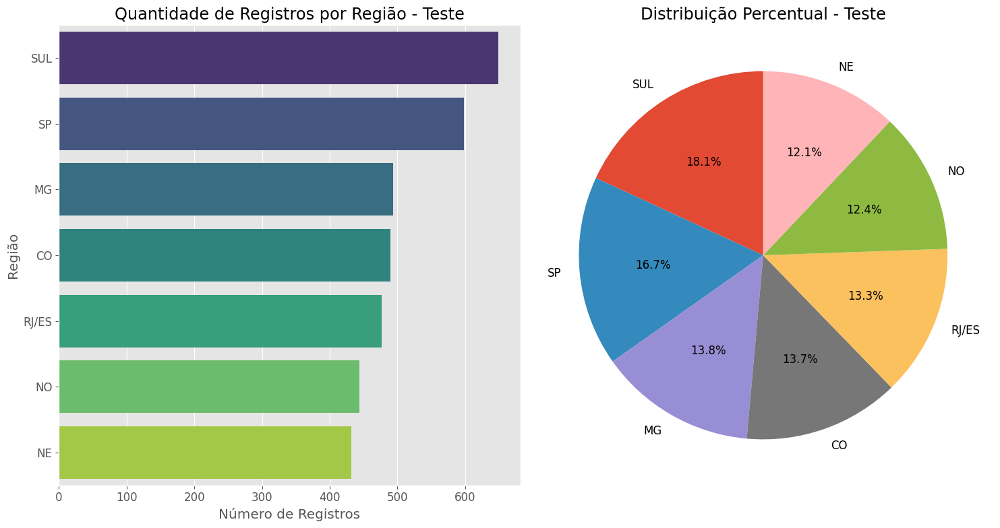

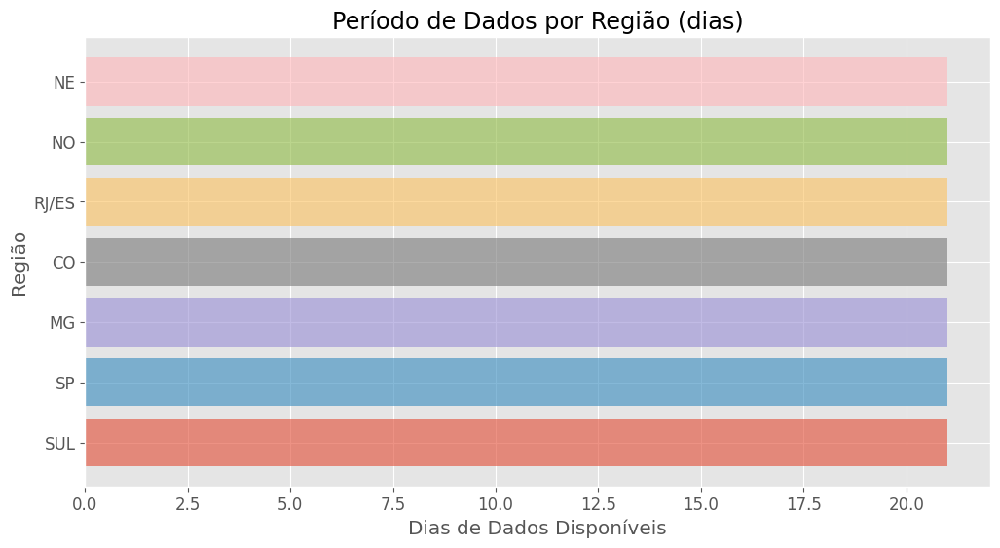


Comparação entre Bases de Treino e Teste:
Região  Treino  Teste  Proporção Teste/Treino
    CO   15426    490                   3.180
    MG   16099    494                   3.070
    NE   14159    432                   3.050
    NO   13473    444                   3.300
 RJ/ES   15478    477                   3.080
    SP   19314    598                   3.100
   SUL   20175    649                   3.220


<Figure size 1200x600 with 0 Axes>

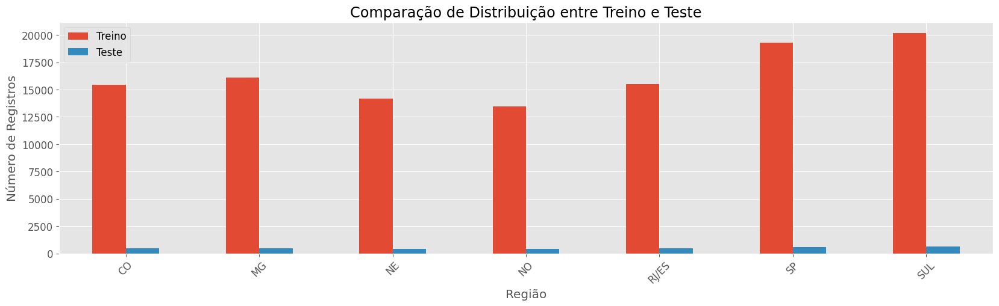

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def load_and_analyze_data(train_path, test_path=None):
    """Carrega e analisa a distribuição de dados por região"""
    
    # Carregar base de treino
    try:
        print(f"Carregando base de treino: {train_path}")
        train_df = pd.read_excel(train_path, parse_dates=['dt_completa'])
        
        # Padronizar nomes das regiões
        train_df['geo'] = train_df['geo'].str.replace('GEO ', '')
        
        # Análise da base de treino
        print("\n=== Análise da Base de Treino ===")
        analyze_data_distribution(train_df, "Treino")
        
        # Se houver base de teste, analisar também
        if test_path:
            print(f"\nCarregando base de teste: {test_path}")
            test_df = pd.read_excel(test_path, parse_dates=['dt_completa'])
            test_df['geo'] = test_df['geo'].str.replace('GEO ', '')
            
            print("\n=== Análise da Base de Teste ===")
            analyze_data_distribution(test_df, "Teste")
            
            # Análise comparativa
            compare_train_test_distribution(train_df, test_df)
            
    except Exception as e:
        print(f"Erro ao carregar dados: {e}")
        return None

def analyze_data_distribution(df, dataset_name):
    """Analisa a distribuição de dados por região em um DataFrame"""
    
    # Contagem por região
    region_counts = df['geo'].value_counts().sort_index()
    
    # Estatísticas básicas
    total_records = len(df)
    num_regions = len(region_counts)
    
    print(f"\nDistribuição de dados no dataset {dataset_name}:")
    print(f"Total de registros: {total_records:,}")
    print(f"Número de regiões: {num_regions}\n")
    
    # DataFrame com estatísticas detalhadas
    stats_df = pd.DataFrame({
        'Região': region_counts.index,
        'Quantidade': region_counts.values,
        'Percentual': (region_counts.values / total_records * 100).round(2)
    })
    
    # Adicionar informações temporais
    time_stats = df.groupby('geo')['dt_completa'].agg(['min', 'max', 'nunique'])
    time_stats['Período'] = (time_stats['max'] - time_stats['min']).dt.days
    stats_df = stats_df.merge(time_stats, left_on='Região', right_index=True)
    
    # Ordenar por quantidade
    stats_df = stats_df.sort_values('Quantidade', ascending=False)
    
    print("Estatísticas detalhadas por região:")
    print(stats_df.to_string(index=False))
    
    # Plotar gráficos
    plot_distribution(stats_df, dataset_name)
    
    return stats_df

def plot_distribution(stats_df, title):
    """Plota gráficos da distribuição por região"""
    
    plt.figure(figsize=(15, 8))
    
    # Gráfico de barras
    plt.subplot(1, 2, 1)
    sns.barplot(data=stats_df, x='Quantidade', y='Região', palette='viridis')
    plt.title(f'Quantidade de Registros por Região - {title}')
    plt.xlabel('Número de Registros')
    plt.ylabel('Região')
    
    # Gráfico de pizza (percentual)
    plt.subplot(1, 2, 2)
    plt.pie(stats_df['Quantidade'], labels=stats_df['Região'], 
            autopct='%1.1f%%', startangle=90)
    plt.title(f'Distribuição Percentual - {title}')
    
    plt.tight_layout()
    plt.show()
    
    # Gráfico temporal
    plt.figure(figsize=(12, 6))
    for region in stats_df['Região']:
        region_data = stats_df[stats_df['Região'] == region]
        plt.barh(region, region_data['Período'].values[0], alpha=0.6)
    plt.title('Período de Dados por Região (dias)')
    plt.xlabel('Dias de Dados Disponíveis')
    plt.ylabel('Região')
    plt.show()

def compare_train_test_distribution(train_df, test_df):
    """Compara a distribuição entre treino e teste"""
    
    train_counts = train_df['geo'].value_counts().sort_index()
    test_counts = test_df['geo'].value_counts().sort_index()
    
    comparison_df = pd.DataFrame({
        'Região': train_counts.index,
        'Treino': train_counts.values,
        'Teste': test_counts.values,
        'Proporção Teste/Treino': (test_counts.values / train_counts.values * 100).round(2)
    })
    
    print("\nComparação entre Bases de Treino e Teste:")
    print(comparison_df.to_string(index=False))
    
    # Plotar comparação
    plt.figure(figsize=(12, 6))
    comparison_df.plot(x='Região', y=['Treino', 'Teste'], kind='bar')
    plt.title('Comparação de Distribuição entre Treino e Teste')
    plt.ylabel('Número de Registros')
    plt.xticks(rotation=45)
    plt.show()

if __name__ == "__main__":
    # Caminhos dos arquivos (ajuste conforme necessário)
    train_path = "/kaggle/input/data-elasticidade/base_treino.xlsx"
    test_path = "/kaggle/input/data-elasticidade/base_teste.xlsx"
    
    # Executar análise
    load_and_analyze_data(train_path, test_path)

# Modelo

Tamanho do treino: 114124, Tamanho do teste: 3584

=== Modelo para a região: GEO NO ===
Melhores parâmetros para GEO NO: {'colsample_bytree': 0.7, 'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 100, 'reg_alpha': 0.1, 'reg_lambda': 1.0, 'subsample': 0.6}
RMSE CV para GEO NO: 0.159314
Soma dos shares previstos: 1.00%

Métricas agregadas para a região GEO NO:
R² (treino): 0.9895
R² (teste): 0.9561
WMAPE (teste): 13.70%
RMSE (teste): 0.003445
RMSE CV: 0.159314
Coeficiente de price_index_tt: -1.335344
Relação negativa preço-share? Sim


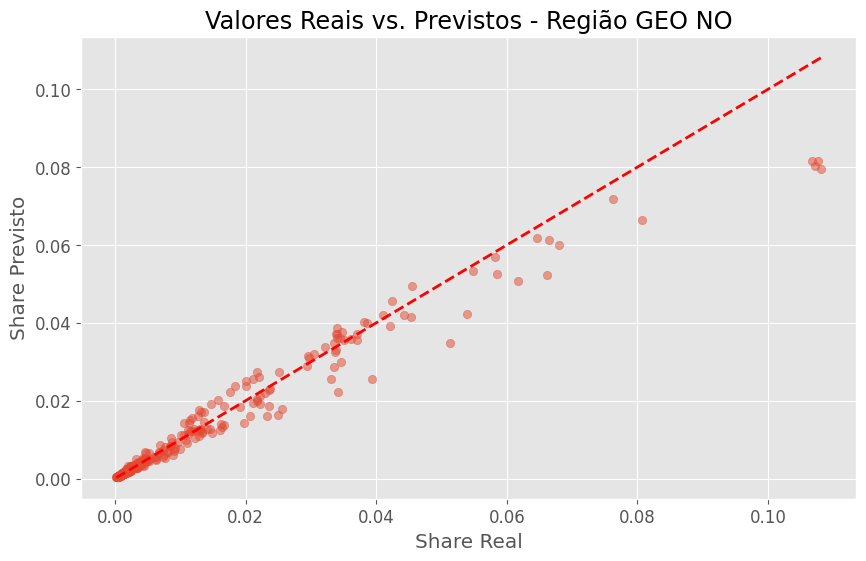


=== Modelo para a região: GEO CO ===
Melhores parâmetros para GEO CO: {'colsample_bytree': 0.7, 'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 100, 'reg_alpha': 0.1, 'reg_lambda': 1.0, 'subsample': 0.6}
RMSE CV para GEO CO: 0.138127
Soma dos shares previstos: 1.00%

Métricas agregadas para a região GEO CO:
R² (treino): 0.9917
R² (teste): 0.9743
WMAPE (teste): 10.28%
RMSE (teste): 0.002446
RMSE CV: 0.138127
Coeficiente de price_index_tt: -1.386628
Relação negativa preço-share? Sim


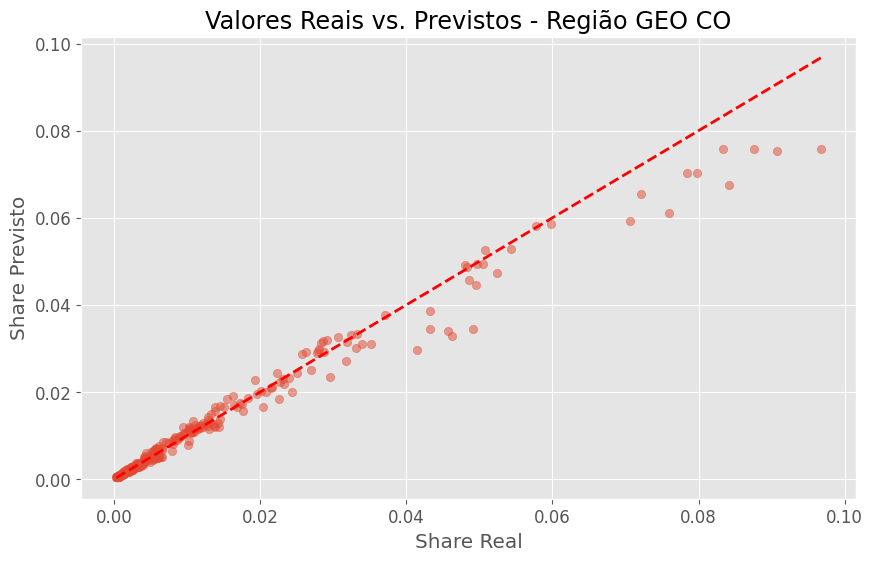


=== Modelo para a região: GEO SP ===
Melhores parâmetros para GEO SP: {'colsample_bytree': 0.7, 'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 100, 'reg_alpha': 0.1, 'reg_lambda': 1.0, 'subsample': 0.6}
RMSE CV para GEO SP: 0.136158
Soma dos shares previstos: 1.00%

Métricas agregadas para a região GEO SP:
R² (treino): 0.9912
R² (teste): 0.9625
WMAPE (teste): 13.50%
RMSE (teste): 0.002424
RMSE CV: 0.136158
Coeficiente de price_index_tt: -1.580242
Relação negativa preço-share? Sim


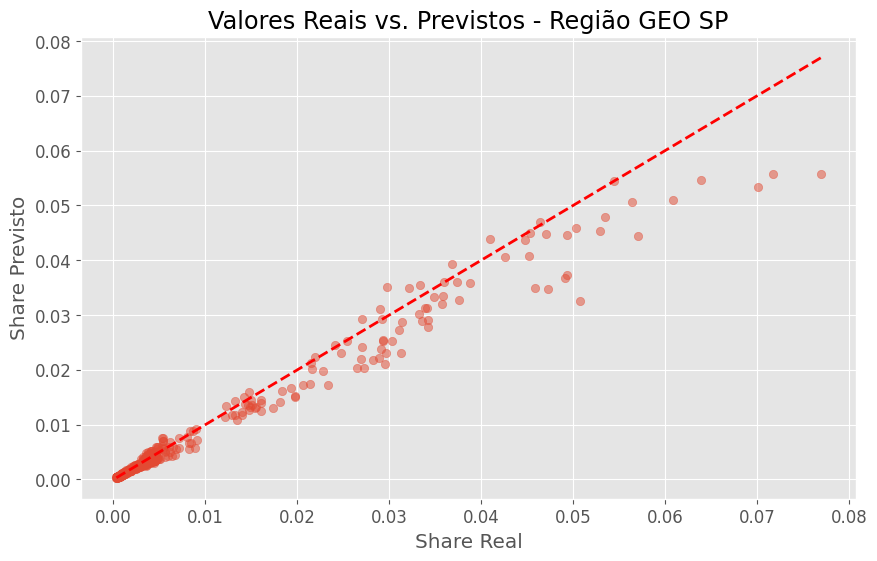


=== Modelo para a região: GEO SUL ===
Melhores parâmetros para GEO SUL: {'colsample_bytree': 0.7, 'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 100, 'reg_alpha': 0.1, 'reg_lambda': 1.0, 'subsample': 0.6}
RMSE CV para GEO SUL: 0.153238
Soma dos shares previstos: 1.00%

Métricas agregadas para a região GEO SUL:
R² (treino): 0.9882
R² (teste): 0.9526
WMAPE (teste): 14.88%
RMSE (teste): 0.002532
RMSE CV: 0.153238
Coeficiente de price_index_tt: -1.771991
Relação negativa preço-share? Sim


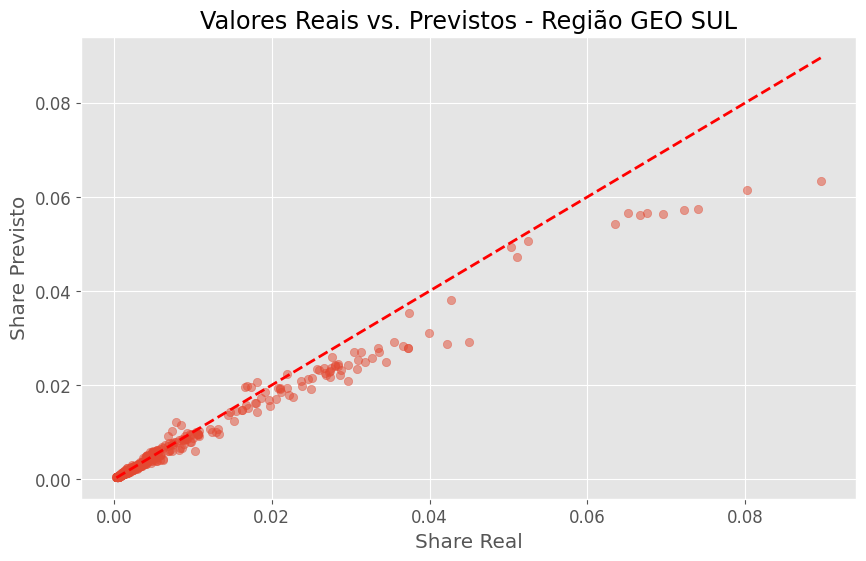


=== Modelo para a região: GEO RJ/ES ===
Melhores parâmetros para GEO RJ/ES: {'colsample_bytree': 0.7, 'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 100, 'reg_alpha': 0.1, 'reg_lambda': 1.0, 'subsample': 0.7}
RMSE CV para GEO RJ/ES: 0.163113
Soma dos shares previstos: 1.00%

Métricas agregadas para a região GEO RJ/ES:
R² (treino): 0.9889
R² (teste): 0.9548
WMAPE (teste): 13.23%
RMSE (teste): 0.003611
RMSE CV: 0.163113
Coeficiente de price_index_tt: -1.398666
Relação negativa preço-share? Sim


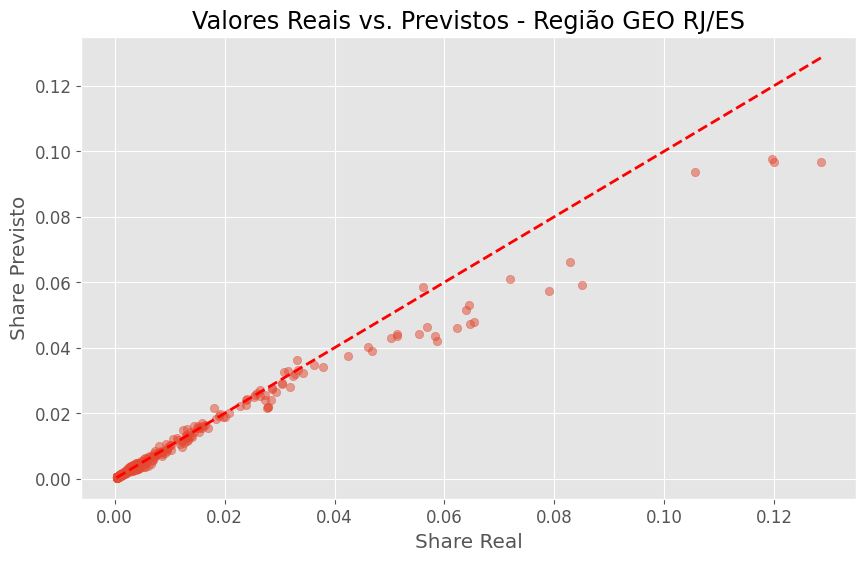


=== Modelo para a região: GEO NE ===
Melhores parâmetros para GEO NE: {'colsample_bytree': 0.7, 'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 100, 'reg_alpha': 0.1, 'reg_lambda': 1.0, 'subsample': 0.6}
RMSE CV para GEO NE: 0.158692
Soma dos shares previstos: 1.00%

Métricas agregadas para a região GEO NE:
R² (treino): 0.9895
R² (teste): 0.9597
WMAPE (teste): 14.54%
RMSE (teste): 0.003490
RMSE CV: 0.158692
Coeficiente de price_index_tt: -0.868471
Relação negativa preço-share? Sim


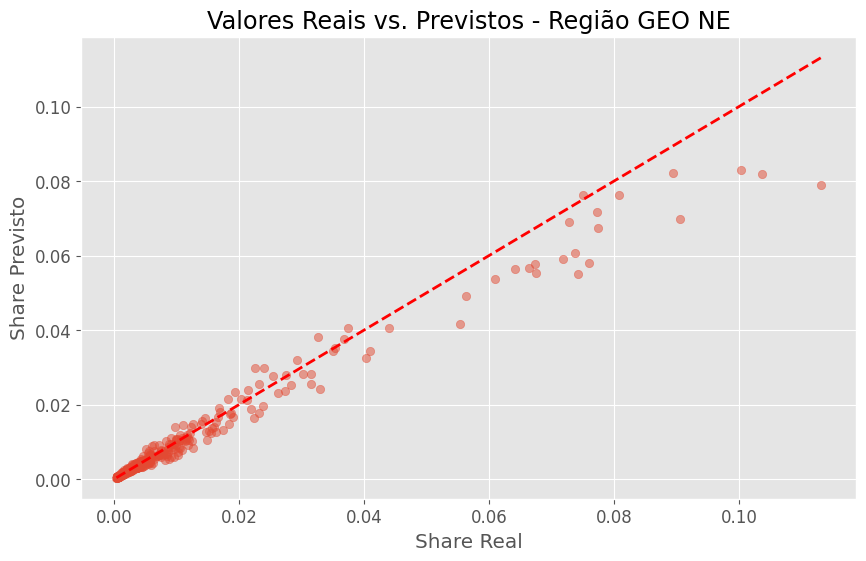


=== Modelo para a região: GEO MG ===
Melhores parâmetros para GEO MG: {'colsample_bytree': 0.7, 'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 100, 'reg_alpha': 0.1, 'reg_lambda': 1.0, 'subsample': 0.7}
RMSE CV para GEO MG: 0.140928
Soma dos shares previstos: 1.00%

Métricas agregadas para a região GEO MG:
R² (treino): 0.9914
R² (teste): 0.9411
WMAPE (teste): 14.24%
RMSE (teste): 0.004186
RMSE CV: 0.140928
Coeficiente de price_index_tt: -1.520321
Relação negativa preço-share? Sim


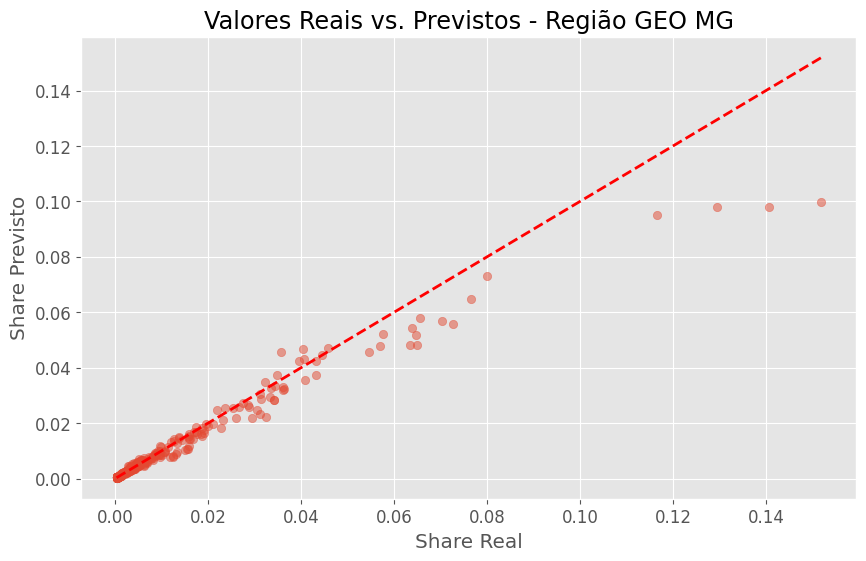


=== Modelo para o total agregado (BR) ===
Melhores parâmetros para BR: {'colsample_bytree': 0.7, 'learning_rate': 0.05, 'max_depth': 3, 'n_estimators': 100, 'reg_alpha': 0.1, 'reg_lambda': 1.0, 'subsample': 0.6}
RMSE CV para BR: 0.226062
Soma dos shares previstos: 1.00%

Métricas agregadas para o total agregado (BR):
R² (treino): 0.9751
R² (teste): 0.8790
WMAPE (teste): 19.93%
RMSE (teste): 0.005309
RMSE CV: 0.226062
Coeficiente de price_index_tt: -1.460250
Relação negativa preço-share? Sim


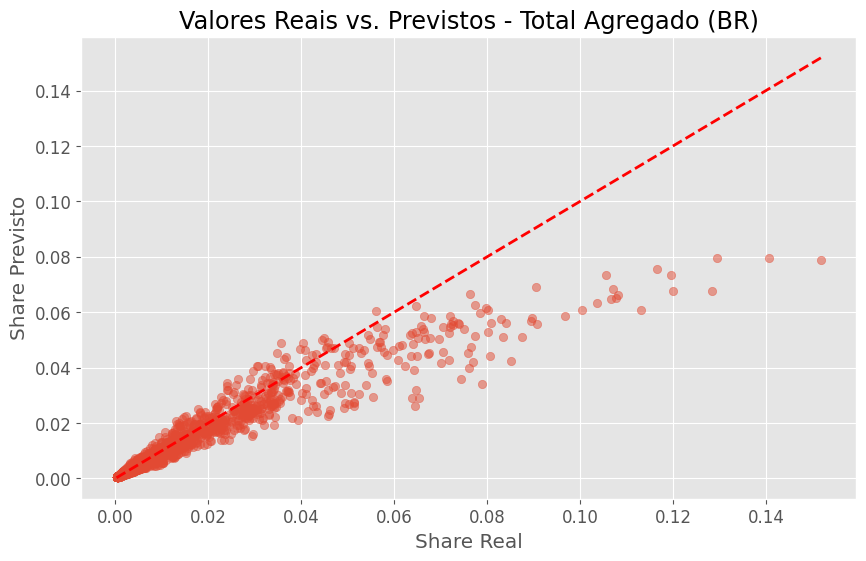

In [12]:
import pandas as pd
import numpy as np
import xgboost as xgb
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV, cross_val_score
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt

# Funções auxiliares
def calculate_wmape(y_true, y_pred, weights):
    absolute_percentage_error = np.abs((y_true - y_pred) / y_true)
    weighted_ape = absolute_percentage_error * weights
    wmape = np.sum(weighted_ape) / np.sum(weights) * 100
    return wmape

def calculate_r2(y_true, y_pred):
    ss_tot = np.sum((y_true - np.mean(y_true)) ** 2)
    ss_res = np.sum((y_true - y_pred) ** 2)
    return 1 - (ss_res / ss_tot)

# Carregar os dados
train_data = pd.read_excel('/kaggle/input/data-elasticidade/base_treino.xlsx')
test_data = pd.read_excel('/kaggle/input/data-elasticidade/base_teste.xlsx')

# Calcular o share
train_data['share'] = train_data['vendas_in_hl'] / train_data['vendas_tt']
test_data['share'] = test_data['vendas_in_hl'] / test_data['vendas_tt']

# Print de Tamanho
print(f"Tamanho do treino: {len(train_data)}, Tamanho do teste: {len(test_data)}")

# Tratar valores ausentes
for col in ['price_index_tt', 'distr_numerica_dn', 'trend', 'share', 'sub_segmento', 'price_index_tss', 'uf', 'canal', 'preco_medio_in_hl', 'distr_pond_vendedora', 'preco_medio_tss', 'volume_total', 'vendas_normalizada_in_hl', 'preco_normalizado_in_hl']:
    if col not in ['sub_segmento', 'uf', 'canal']:
        train_data[col] = pd.to_numeric(train_data[col], errors='coerce').fillna(train_data[col].median())
        test_data[col] = pd.to_numeric(test_data[col], errors='coerce').fillna(test_data[col].median())
    else:
        train_data[col] = train_data[col].fillna(train_data[col].mode()[0])
        test_data[col] = test_data[col].fillna(test_data[col].mode()[0])

# Criar variável de sazonalidade
train_data['alta_temporada'] = train_data['mes'].isin([12, 1, 2]).astype(int)
test_data['alta_temporada'] = test_data['mes'].isin([12, 1, 2]).astype(int)

# Transformação logarítmica
train_data['log_share'] = np.log(train_data['share'] + 1e-5)
test_data['log_share'] = np.log(test_data['share'] + 1e-5)

regions = train_data['geo'].unique()
metrics_by_region = {}

for region in regions:
    print(f"\n=== Modelo para a região: {region} ===")
    train_region = train_data[train_data['geo'] == region].copy()
    test_region = test_data[test_data['geo'] == region].copy()
    
    if len(train_region) < 10 or len(test_region) < 10:
        print(f"Dados insuficientes para a região {region}. Pulando...")
        continue
    
    features = ['price_index_tt', 'distr_numerica_dn', 'trend', 'price_index_tss', 'preco_medio_in_hl', 
                'distr_pond_vendedora', 'preco_medio_tss', 'volume_total', 'vendas_normalizada_in_hl', 
                'preco_normalizado_in_hl', 'alta_temporada', 'uf', 'canal', 'mes']
    
    # Criar interações
    train_region['price_index_tt_distr'] = train_region['price_index_tt'] * train_region['distr_numerica_dn']
    test_region['price_index_tt_distr'] = test_region['price_index_tt'] * test_region['distr_numerica_dn']
    train_region['price_index_tt_preco'] = train_region['price_index_tt'] * train_region['preco_medio_in_hl']
    test_region['price_index_tt_preco'] = test_region['price_index_tt'] * test_region['preco_medio_in_hl']
    
    # Dummies
    X_train = pd.get_dummies(train_region[features], columns=['uf', 'canal', 'mes'], drop_first=True)
    X_test = pd.get_dummies(test_region[features], columns=['uf', 'canal', 'mes'], drop_first=True)
    X_train, X_test = X_train.align(X_test, join='left', axis=1, fill_value=0)
    y_train = train_region['log_share']
    
    # Configurar XGBoost
    xgb_model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)
    param_grid = {
        'n_estimators': [50, 100],
        'max_depth': [2, 3],
        'learning_rate': [0.01, 0.05],
        'subsample': [0.6, 0.7],
        'colsample_bytree': [0.6, 0.7],
        'reg_alpha': [0.1, 1.0],
        'reg_lambda': [1.0, 10.0]
    }
    grid_search = GridSearchCV(xgb_model, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
    grid_search.fit(X_train, y_train)
    model_xgb = grid_search.best_estimator_
    print(f"Melhores parâmetros para {region}: {grid_search.best_params_}")
    
    # Validação cruzada
    scores = cross_val_score(model_xgb, X_train, y_train, cv=5, scoring='neg_mean_squared_error')
    rmse_cv = np.sqrt(-scores.mean())
    print(f"RMSE CV para {region}: {rmse_cv:.6f}")
    
    # Previsão
    test_region['share_pred'] = np.exp(model_xgb.predict(X_test)) - 1e-5
    test_region['share_pred_normalized'] = test_region['share_pred'] / test_region['share_pred'].sum()
    
    # Métricas
    y_true = test_region['share']
    y_pred = test_region['share_pred']
    weights = test_region['vendas_in_hl']
    
    r2 = calculate_r2(y_train, model_xgb.predict(X_train))
    r2_test = calculate_r2(y_true, y_pred)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    wmape = calculate_wmape(y_true, y_pred, weights)
    
    # OLS para elasticidade
    ols_formula = 'log_share ~ price_index_tt + distr_numerica_dn + trend + price_index_tss + C(canal) + C(mes)'
    model_ols = smf.ols(ols_formula, data=train_region).fit()
    price_coef = model_ols.params['price_index_tt']
    price_negative = "Sim" if price_coef < 0 else "Não"
    
    total_share_pred = test_region['share_pred_normalized'].sum()
    print(f"Soma dos shares previstos: {total_share_pred:.2f}%")
    
    metrics_by_region[region] = {
        'R² (treino)': r2,
        'R² (teste)': r2_test,
        'WMAPE (teste)': wmape,
        'RMSE (teste)': rmse,
        'RMSE CV': rmse_cv,
        'Coeficiente de price_index_tt': price_coef,
        'Relação negativa preço-share': price_negative
    }
    
    print(f"\nMétricas agregadas para a região {region}:")
    print(f"R² (treino): {r2:.4f}")
    print(f"R² (teste): {r2_test:.4f}")
    print(f"WMAPE (teste): {wmape:.2f}%")
    print(f"RMSE (teste): {rmse:.6f}")
    print(f"RMSE CV: {rmse_cv:.6f}")
    print(f"Coeficiente de price_index_tt: {price_coef:.6f}")
    print(f"Relação negativa preço-share? {price_negative}")
    
    plt.figure(figsize=(10, 6))
    plt.scatter(y_true, y_pred, alpha=0.5)
    plt.plot([y_true.min(), y_true.max()], [y_true.min(), y_true.max()], 'r--', lw=2)
    plt.xlabel('Share Real')
    plt.ylabel('Share Previsto')
    plt.title(f'Valores Reais vs. Previstos - Região {region}')
    plt.show()

# Total agregado (BR)
print("\n=== Modelo para o total agregado (BR) ===")
train_br = train_data.copy()
test_br = test_data.copy()

X_train_br = pd.get_dummies(train_br[features], columns=['uf', 'canal', 'mes'], drop_first=True)
X_test_br = pd.get_dummies(test_br[features], columns=['uf', 'canal', 'mes'], drop_first=True)
X_train_br, X_test_br = X_train_br.align(X_test_br, join='left', axis=1, fill_value=0)
y_train_br = train_br['log_share']

xgb_model_br = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)
grid_search_br = GridSearchCV(xgb_model_br, param_grid, cv=5, scoring='neg_mean_squared_error', n_jobs=-1)
grid_search_br.fit(X_train_br, y_train_br)
model_xgb_br = grid_search_br.best_estimator_
print(f"Melhores parâmetros para BR: {grid_search_br.best_params_}")

scores_br = cross_val_score(model_xgb_br, X_train_br, y_train_br, cv=5, scoring='neg_mean_squared_error')
rmse_cv_br = np.sqrt(-scores_br.mean())
print(f"RMSE CV para BR: {rmse_cv_br:.6f}")

test_br['share_pred'] = np.exp(model_xgb_br.predict(X_test_br)) - 1e-5
test_br['share_pred_normalized'] = test_br['share_pred'] / test_br['share_pred'].sum()

y_true_br = test_br['share']
y_pred_br = test_br['share_pred']
weights_br = test_br['vendas_in_hl']

r2_br = calculate_r2(y_train_br, model_xgb_br.predict(X_train_br))
r2_test_br = calculate_r2(y_true_br, y_pred_br)
rmse_br = np.sqrt(mean_squared_error(y_true_br, y_pred_br))
wmape_br = calculate_wmape(y_true_br, y_pred_br, weights_br)

ols_formula_br = 'log_share ~ price_index_tt + distr_numerica_dn + trend + price_index_tss + C(canal) + C(mes)'
model_ols_br = smf.ols(ols_formula_br, data=train_br).fit()
price_coef_br = model_ols_br.params['price_index_tt']
price_negative_br = "Sim" if price_coef_br < 0 else "Não"

total_share_pred_br = test_br['share_pred_normalized'].sum()
print(f"Soma dos shares previstos: {total_share_pred_br:.2f}%")

metrics_by_region['BR'] = {
    'R² (treino)': r2_br,
    'R² (teste)': r2_test_br,
    'WMAPE (teste)': wmape_br,
    'RMSE (teste)': rmse_br,
    'RMSE CV': rmse_cv_br,
    'Coeficiente de price_index_tt': price_coef_br,
    'Relação negativa preço-share': price_negative_br
}

print(f"\nMétricas agregadas para o total agregado (BR):")
print(f"R² (treino): {r2_br:.4f}")
print(f"R² (teste): {r2_test_br:.4f}")
print(f"WMAPE (teste): {wmape_br:.2f}%")
print(f"RMSE (teste): {rmse_br:.6f}")
print(f"RMSE CV: {rmse_cv_br:.6f}")
print(f"Coeficiente de price_index_tt: {price_coef_br:.6f}")
print(f"Relação negativa preço-share? {price_negative_br}")

plt.figure(figsize=(10, 6))
plt.scatter(y_true_br, y_pred_br, alpha=0.5)
plt.plot([y_true_br.min(), y_true_br.max()], [y_true_br.min(), y_true_br.max()], 'r--', lw=2)
plt.xlabel('Share Real')
plt.ylabel('Share Previsto')
plt.title('Valores Reais vs. Previstos - Total Agregado (BR)')
plt.show()

Coeficiente de price_index_tt:

- log_share ~ price_index_tt + price_index_tss
- log_share ~ price_index_tt + price_index_tss + (1|produto)
- log_share ~ price_index_tt + price_index_tss+ (1|produto) + (-1+price_index_tt|produto)+(-1+price_index_tss|produto)

# Simulação ajustada

In [6]:
import pandas as pd
import numpy as np

# Função ajustada para simular variação de preço
def simulate_price_change(data, product, price_change, elasticity, price_col, volume_col, share_col):
    # Copiar os dados para evitar alterações no original
    data_sim = data.copy()
    
    # Calcular o preço médio inicial da categoria (ponderado pelo volume)
    total_volume = data_sim[volume_col].sum()
    data_sim['weighted_price'] = data_sim[price_col] * data_sim[volume_col]
    initial_avg_price = data_sim['weighted_price'].sum() / total_volume
    
    # Calcular o price_index inicial
    data_sim['price_index_initial'] = data_sim[price_col] / initial_avg_price
    
    # Salvar preço inicial
    data_sim['preco_inicial'] = data_sim[price_col]
    
    # Aplicar a variação de preço ao produto especificado
    data_sim.loc[data_sim['tag_prod'] == product, price_col] *= (1 + price_change)
    
    # Calcular o novo preço médio da categoria
    data_sim['weighted_price'] = data_sim[price_col] * data_sim[volume_col]
    new_avg_price = data_sim['weighted_price'].sum() / total_volume
    
    # Calcular o novo price_index
    data_sim['price_index_new'] = data_sim[price_col] / new_avg_price
    
    # Calcular a variação no price_index
    data_sim['delta_price_index'] = data_sim['price_index_new'] - data_sim['price_index_initial']
    
    # Salvar volume e share iniciais
    data_sim['volume_inicial'] = data_sim[volume_col]
    data_sim['share_inicial'] = data_sim[share_col]
    
    # Calcular o impacto no share usando a elasticidade
    data_sim['delta_log_share'] = 0.0  # Inicializar com float
    
    # Impacto no produto alterado (elasticidade própria)
    data_sim.loc[data_sim['tag_prod'] == product, 'delta_log_share'] = elasticity * data_sim.loc[data_sim['tag_prod'] == product, 'delta_price_index']
    
    # Calcular o novo share do produto alterado
    data_sim['share_new'] = data_sim[share_col] * np.exp(data_sim['delta_log_share'])
    
    # Calcular o share perdido pelo produto alterado
    share_lost = (data_sim.loc[data_sim['tag_prod'] == product, share_col].iloc[0] - 
                  data_sim.loc[data_sim['tag_prod'] == product, 'share_new'].iloc[0])
    
    # Distribuir o share perdido entre os outros produtos proporcionalmente ao share inicial
    total_share_others = data_sim.loc[data_sim['tag_prod'] != product, share_col].sum()
    if total_share_others > 0:  # Evitar divisão por zero
        data_sim.loc[data_sim['tag_prod'] != product, 'share_new'] = (
            data_sim.loc[data_sim['tag_prod'] != product, share_col] + 
            (share_lost * data_sim.loc[data_sim['tag_prod'] != product, share_col] / total_share_others)
        )
    else:
        data_sim.loc[data_sim['tag_prod'] != product, 'share_new'] = data_sim.loc[data_sim['tag_prod'] != product, share_col]
    
    # Normalizar os novos shares para somar 1
    total_share_new = data_sim['share_new'].sum()
    if total_share_new > 0:  # Evitar divisão por zero
        data_sim['share_new_normalized'] = data_sim['share_new'] / total_share_new
    else:
        data_sim['share_new_normalized'] = data_sim['share_new']
    
    # Calcular o ganho de share
    data_sim['ganho_share'] = data_sim['share_new_normalized'] - data_sim[share_col]
    
    # Calcular o novo volume (assumindo volume total constante)
    total_volume_initial = data_sim['volume_inicial'].sum()
    data_sim['volume_final'] = data_sim['share_new_normalized'] * total_volume_initial
    
    # Calcular o ganho de volume
    data_sim['ganho_volume'] = data_sim['volume_final'] - data_sim['volume_inicial']
    
    # Calcular o impacto relativo (em percentual)
    data_sim['impacto_relativo'] = data_sim['volume_final'] / data_sim['volume_inicial']
    data_sim['impacto_relativo_percentual'] = (data_sim['impacto_relativo'] - 1) * 100  # Em percentual
    
    # Calcular a captura (apenas para produtos que não tiveram variação de preço)
    total_volume_lost = -data_sim.loc[data_sim['tag_prod'] == product, 'ganho_volume'].iloc[0]  # Volume perdido pelo produto alterado
    # Calcular a captura bruta
    data_sim['captura'] = np.where(
        data_sim['tag_prod'] != product,
        data_sim['ganho_volume'] / total_volume_lost if total_volume_lost != 0 else 0,
        0
    )
    # Normalizar a captura para somar 1
    captura_sum = data_sim['captura'].sum()
    if captura_sum != 0:
        data_sim['captura'] = data_sim['captura'] / captura_sum
    else:
        data_sim['captura'] = 0
    
    # Salvar preço final
    data_sim['preco_final'] = data_sim[price_col]
    
    # Renomear colunas para corresponder às exigências
    data_sim['share_final'] = data_sim['share_new_normalized']
    
    # Calcular o ganho de share em percentual
    data_sim['ganho_share_percentual'] = (data_sim['share_final'] / data_sim['share_inicial'] - 1) * 100
    
    return data_sim

# Carregar os dados
train_data = pd.read_excel('/kaggle/input/data-elasticidade/base_treino.xlsx')

# Filtrar para GEO NO
train_geo_no = train_data[train_data['geo'] == 'GEO NO'].copy()

# Calcular o share corretamente
total_vendas_in_hl = train_geo_no['vendas_in_hl'].sum()
train_geo_no['share'] = train_geo_no['vendas_in_hl'] / total_vendas_in_hl

# Simular uma variação de preço de +1% para o produto
product_to_change = 'P000000000002014174000000002000156011654'
price_change = 0.01  # +1%
elasticity = -1.3353  # Nova elasticidade para GEO NO

# Simular a variação de preço
result_sim = simulate_price_change(
    data=train_geo_no,
    product=product_to_change,
    price_change=price_change,
    elasticity=elasticity,
    price_col='preco_medio_in_hl',
    volume_col='vendas_in_hl',
    share_col='share'
)

# Exibir os resultados com as variáveis exigidas
print(f"\n=== Simulação para GEO NO ===")
print(f"Produto alterado: {product_to_change}")
print(f"Variação de preço: {price_change*100}%")
print(f"Elasticidade usada: {elasticity}")
print("\nResultados:")
print(result_sim[[
    'tag_prod', 'volume_inicial', 'volume_final', 'share_inicial', 'share_final',
    'preco_inicial', 'preco_final', 'impacto_relativo', 'impacto_relativo_percentual',
    'ganho_volume', 'ganho_share', 'ganho_share_percentual', 'captura'
]].head())

# Verificar a soma dos shares e volumes
print(f"\nSoma dos shares iniciais: {result_sim['share_inicial'].sum():.4f}")
print(f"Soma dos shares finais: {result_sim['share_final'].sum():.4f}")
print(f"Soma dos volumes iniciais: {result_sim['volume_inicial'].sum():.4f}")
print(f"Soma dos volumes finais: {result_sim['volume_final'].sum():.4f}")
print(f"Soma da captura: {result_sim['captura'].sum():.4f}")


=== Simulação para GEO NO ===
Produto alterado: P000000000002014174000000002000156011654
Variação de preço: 1.0%
Elasticidade usada: -1.3353

Resultados:
                                   tag_prod  volume_inicial  volume_final  \
0  P000000000002014174000000002000156011654         476.110       471.995   
1  P000000000002014174000000002000156011681        1124.090      1124.184   
2  P000000000002014174000000002000156011682         430.670       430.706   
3  P000000000002014174000000002000156011800          41.700        41.703   
4  P000000000002014174000000002000156011804         871.400       871.473   

   share_inicial  share_final  preco_inicial  preco_final  impacto_relativo  \
0          0.000        0.000        693.252      700.184             0.991   
1          0.001        0.001        714.227      714.227             1.000   
2          0.000        0.000        641.057      641.057             1.000   
3          0.000        0.000       1001.367     1001.367         

# Calculo por produto

In [7]:
import pandas as pd
import numpy as np
import statsmodels.formula.api as smf
from statsmodels.api import MixedLM

# Função para mapear 'uf' para 'geo'
def map_uf_to_geo(df):
    uf_to_geo = {
        'CO': 'GEO CO',
        'MG': 'GEO MG',
        'NE': 'GEO NE',
        'NO': 'GEO NO',
        'RJ_ES': 'GEO RJ/ES',
        'SP': 'GEO SP',
        'SUL': 'GEO SUL'
    }
    df['geo'] = df['uf'].map(uf_to_geo)
    df_br = df.copy()
    df_br['geo'] = 'BR'
    df = pd.concat([df, df_br], ignore_index=True)
    return df

# Função para simular variação de preço para um produto específico
def simulate_price_change(data, product, price_change, price_col, volume_col, share_col):
    data_sim = data.copy()
    
    # Calcular o preço médio inicial da categoria (ponderado pelo volume)
    total_volume = data_sim[volume_col].sum()
    data_sim['weighted_price'] = data_sim[price_col] * data_sim[volume_col]
    initial_avg_price = data_sim['weighted_price'].sum() / total_volume
    
    # Calcular o price_index inicial
    data_sim['price_index_initial'] = data_sim[price_col] / initial_avg_price
    
    # Salvar preço inicial
    data_sim['preco_inicial'] = data_sim[price_col]
    
    # Aplicar a variação de preço ao produto especificado
    data_sim.loc[data_sim['tag_prod'] == product, price_col] *= (1 + price_change)
    
    # Calcular o novo preço médio da categoria
    data_sim['weighted_price'] = data_sim[price_col] * data_sim[volume_col]
    new_avg_price = data_sim['weighted_price'].sum() / total_volume
    
    # Calcular o novo price_index
    data_sim['price_index_new'] = data_sim[price_col] / new_avg_price
    
    # Calcular a variação no price_index
    data_sim['delta_price_index'] = data_sim['price_index_new'] - data_sim['price_index_initial']
    
    return data_sim

# Função para calcular a elasticidade por produto usando um modelo linear misto
def calculate_elasticity_per_product(data, regions, product, price_change):
    elasticities_by_product = {}
    
    for region in regions:
        # Filtrar dados da região
        region_data = data[data['geo'] == region].copy()
        
        if region_data.empty:
            print(f"Região {region} não encontrada nos dados. Pulando cálculo de elasticidade.")
            elasticities_by_product[region] = {}
            continue
        
        # Calcular o share
        total_vendas_in_hl = region_data['vendas_in_hl'].sum()
        region_data['share'] = region_data['vendas_in_hl'] / total_vendas_in_hl
        
        # Verificar se o produto existe na região
        if product not in region_data['tag_prod'].values:
            # Se o produto não existe, escolher outro produto da marca AMSTEL
            amstel_products = region_data[region_data['marca_original'] == 'AMSTEL']['tag_prod'].unique()
            if len(amstel_products) == 0:
                print(f"Marca AMSTEL não encontrada na região {region}. Pulando cálculo de elasticidade.")
                elasticities_by_product[region] = {}
                continue
            product_to_use = amstel_products[0]  # Escolher o primeiro produto da marca AMSTEL
            print(f"Produto {product} não encontrado na região {region}. Usando {product_to_use} para cálculo de elasticidade.")
        else:
            product_to_use = product
        
        # Transformação logarítmica do share
        region_data['log_share'] = np.log(region_data['share'] + 1e-5)
        
        # Verificar se as colunas necessárias existem
        required_columns = ['price_index_tt', 'price_index_tss', 'tag_prod']
        missing_columns = [col for col in required_columns if col not in region_data.columns]
        if missing_columns:
            print(f"Colunas ausentes para {region}: {missing_columns}. Pulando cálculo de elasticidade.")
            elasticities_by_product[region] = {}
            continue
        
        # Ajustar o modelo linear misto
        # Fórmula: log_share ~ price_index_tt + price_index_tss + (1|tag_prod) + (-1+price_index_tt|tag_prod) + (-1+price_index_tss|tag_prod)
        try:
            model_mixed = MixedLM.from_formula(
                formula='log_share ~ price_index_tt + price_index_tss',
                re_formula='1 + price_index_tt + price_index_tss',
                groups=region_data['tag_prod'],
                data=region_data
            ).fit()
            
            # Extrair os efeitos aleatórios para price_index_tt (elasticidade por produto)
            random_effects = model_mixed.random_effects
            elasticities = {}
            for prod in random_effects.keys():
                # O efeito aleatório de price_index_tt para cada produto
                elasticity = model_mixed.fe_params['price_index_tt'] + random_effects[prod]['price_index_tt']
                # Limitar a elasticidade a um intervalo razoável
                if elasticity > 0:
                    elasticity = -0.5  # Ajustar para um valor negativo razoável
                elif elasticity < -3.0:
                    elasticity = -3.0  # Limitar valores muito negativos
                elasticities[prod] = elasticity
            
            elasticities_by_product[region] = elasticities
            
        except Exception as e:
            print(f"Erro ao calcular elasticidade para {region}: {e}")
            elasticities_by_product[region] = {}
    
    return elasticities_by_product

# Função para simular variação de preço para um produto específico (usada nas simulações finais)
def simulate_price_change_final(data, product, price_change, elasticity, price_col, volume_col, share_col):
    data_sim = data.copy()
    
    # Calcular o preço médio inicial da categoria (ponderado pelo volume)
    total_volume = data_sim[volume_col].sum()
    data_sim['weighted_price'] = data_sim[price_col] * data_sim[volume_col]
    initial_avg_price = data_sim['weighted_price'].sum() / total_volume
    
    # Calcular o price_index inicial
    data_sim['price_index_initial'] = data_sim[price_col] / initial_avg_price
    
    # Salvar preço inicial
    data_sim['preco_inicial'] = data_sim[price_col]
    
    # Aplicar a variação de preço ao produto especificado
    data_sim.loc[data_sim['tag_prod'] == product, price_col] *= (1 + price_change)
    
    # Calcular o novo preço médio da categoria
    data_sim['weighted_price'] = data_sim[price_col] * data_sim[volume_col]
    new_avg_price = data_sim['weighted_price'].sum() / total_volume
    
    # Calcular o novo price_index
    data_sim['price_index_new'] = data_sim[price_col] / new_avg_price
    
    # Calcular a variação no price_index
    data_sim['delta_price_index'] = data_sim['price_index_new'] - data_sim['price_index_initial']
    
    # Salvar volume e share iniciais
    data_sim['volume_inicial'] = data_sim[volume_col]
    data_sim['share_inicial'] = data_sim[share_col]
    
    # Calcular o impacto no share usando a elasticidade
    data_sim['delta_log_share'] = 0.0
    data_sim.loc[data_sim['tag_prod'] == product, 'delta_log_share'] = elasticity * data_sim.loc[data_sim['tag_prod'] == product, 'delta_price_index']
    
    # Calcular o novo share do produto alterado
    data_sim['share_new'] = data_sim[share_col] * np.exp(data_sim['delta_log_share'])
    
    # Calcular o share perdido pelo produto alterado
    share_lost = (data_sim.loc[data_sim['tag_prod'] == product, share_col].iloc[0] - 
                  data_sim.loc[data_sim['tag_prod'] == product, 'share_new'].iloc[0])
    
    # Distribuir o share perdido entre os outros produtos proporcionalmente ao share inicial
    total_share_others = data_sim.loc[data_sim['tag_prod'] != product, share_col].sum()
    if total_share_others > 0:
        data_sim.loc[data_sim['tag_prod'] != product, 'share_new'] = (
            data_sim.loc[data_sim['tag_prod'] != product, share_col] + 
            (share_lost * data_sim.loc[data_sim['tag_prod'] != product, share_col] / total_share_others)
        )
    else:
        data_sim.loc[data_sim['tag_prod'] != product, 'share_new'] = data_sim.loc[data_sim['tag_prod'] != product, share_col]
    
    # Normalizar os novos shares para somar 1
    total_share_new = data_sim['share_new'].sum()
    if total_share_new > 0:
        data_sim['share_new_normalized'] = data_sim['share_new'] / total_share_new
    else:
        data_sim['share_new_normalized'] = data_sim['share_new']
    
    # Calcular o ganho de share
    data_sim['ganho_share'] = data_sim['share_new_normalized'] - data_sim[share_col]
    
    # Calcular o novo volume (assumindo volume total constante)
    total_volume_initial = data_sim['volume_inicial'].sum()
    data_sim['volume_final'] = data_sim['share_new_normalized'] * total_volume_initial
    
    # Calcular o ganho de volume
    data_sim['ganho_volume'] = data_sim['volume_final'] - data_sim['volume_inicial']
    
    # Calcular o impacto relativo
    data_sim['impacto_relativo'] = data_sim['volume_final'] / data_sim['volume_inicial']
    
    # Calcular a captura
    total_volume_lost = -data_sim.loc[data_sim['tag_prod'] == product, 'ganho_volume'].iloc[0]
    data_sim['captura'] = np.where(
        data_sim['tag_prod'] != product,
        data_sim['ganho_volume'] / total_volume_lost if total_volume_lost != 0 else 0,
        0
    )
    captura_sum = data_sim['captura'].sum()
    if captura_sum != 0:
        data_sim['captura'] = data_sim['captura'] / captura_sum
    
    # Salvar preço final
    data_sim['preco_final'] = data_sim[price_col]
    
    # Renomear colunas
    data_sim['share_final'] = data_sim['share_new_normalized']
    
    return data_sim

# Função para simular variação de preço para uma marca inteira
def simulate_price_change_by_brand(data, brand, price_change, elasticities, price_col, volume_col, share_col, brand_col='marca_original'):
    data_sim = data.copy()
    
    # Calcular o preço médio inicial da categoria (ponderado pelo volume)
    total_volume = data_sim[volume_col].sum()
    data_sim['weighted_price'] = data_sim[price_col] * data_sim[volume_col]
    initial_avg_price = data_sim['weighted_price'].sum() / total_volume
    
    # Calcular o price_index inicial
    data_sim['price_index_initial'] = data_sim[price_col] / initial_avg_price
    
    # Salvar preço inicial
    data_sim['preco_inicial'] = data_sim[price_col]
    
    # Aplicar a variação de preço a todos os produtos da marca
    data_sim.loc[data_sim[brand_col] == brand, price_col] *= (1 + price_change)
    
    # Calcular o novo preço médio da categoria
    data_sim['weighted_price'] = data_sim[price_col] * data_sim[volume_col]
    new_avg_price = data_sim['weighted_price'].sum() / total_volume
    
    # Calcular o novo price_index
    data_sim['price_index_new'] = data_sim[price_col] / new_avg_price
    
    # Calcular a variação no price_index
    data_sim['delta_price_index'] = data_sim['price_index_new'] - data_sim['price_index_initial']
    
    # Salvar volume e share iniciais
    data_sim['volume_inicial'] = data_sim[volume_col]
    data_sim['share_inicial'] = data_sim[share_col]
    
    # Calcular o impacto no share usando as elasticidades por produto
    data_sim['delta_log_share'] = 0.0
    for prod in data_sim[data_sim[brand_col] == brand]['tag_prod'].unique():
        if prod in elasticities:
            elasticity = elasticities[prod]
            data_sim.loc[data_sim['tag_prod'] == prod, 'delta_log_share'] = elasticity * data_sim.loc[data_sim['tag_prod'] == prod, 'delta_price_index']
    
    # Calcular o novo share dos produtos da marca
    data_sim['share_new'] = data_sim[share_col] * np.exp(data_sim['delta_log_share'])
    
    # Calcular o share perdido pela marca
    share_lost = (data_sim.loc[data_sim[brand_col] == brand, share_col].sum() - 
                  data_sim.loc[data_sim[brand_col] == brand, 'share_new'].sum())
    
    # Distribuir o share perdido entre os outros produtos proporcionalmente ao share inicial
    total_share_others = data_sim.loc[data_sim[brand_col] != brand, share_col].sum()
    if total_share_others > 0:
        data_sim.loc[data_sim[brand_col] != brand, 'share_new'] = (
            data_sim.loc[data_sim[brand_col] != brand, share_col] + 
            (share_lost * data_sim.loc[data_sim[brand_col] != brand, share_col] / total_share_others)
        )
    else:
        data_sim.loc[data_sim[brand_col] != brand, 'share_new'] = data_sim.loc[data_sim[brand_col] != brand, share_col]
    
    # Normalizar os novos shares para somar 1
    total_share_new = data_sim['share_new'].sum()
    if total_share_new > 0:
        data_sim['share_new_normalized'] = data_sim['share_new'] / total_share_new
    else:
        data_sim['share_new_normalized'] = data_sim['share_new']
    
    # Calcular o ganho de share
    data_sim['ganho_share'] = data_sim['share_new_normalized'] - data_sim[share_col]
    
    # Calcular o novo volume (assumindo volume total constante)
    total_volume_initial = data_sim['volume_inicial'].sum()
    data_sim['volume_final'] = data_sim['share_new_normalized'] * total_volume_initial
    
    # Calcular o ganho de volume
    data_sim['ganho_volume'] = data_sim['volume_final'] - data_sim['volume_inicial']
    
    # Calcular o impacto relativo
    data_sim['impacto_relativo'] = data_sim['volume_final'] / data_sim['volume_inicial']
    
    # Calcular a captura
    total_volume_lost = -data_sim.loc[data_sim[brand_col] == brand, 'ganho_volume'].sum()
    data_sim['captura'] = np.where(
        data_sim[brand_col] != brand,
        data_sim['ganho_volume'] / total_volume_lost if total_volume_lost != 0 else 0,
        0
    )
    captura_sum = data_sim['captura'].sum()
    if captura_sum != 0:
        data_sim['captura'] = data_sim['captura'] / captura_sum
    
    # Salvar preço final
    data_sim['preco_final'] = data_sim[price_col]
    
    # Renomear colunas
    data_sim['share_final'] = data_sim['share_new_normalized']
    
    return data_sim

# Carregar os dados
data = pd.read_excel('/kaggle/input/data-elasticidade/base_para_elasticidades.xlsx')

# Mapear 'uf' para 'geo'
data = map_uf_to_geo(data)

# Calcular o share para cada região
regions = ['GEO CO', 'GEO MG', 'GEO NE', 'GEO NO', 'GEO RJ/ES', 'GEO SP', 'GEO SUL', 'BR']
for region in regions:
    region_data = data[data['geo'] == region].copy()
    total_vendas_in_hl = region_data['vendas_in_hl'].sum()
    data.loc[data['geo'] == region, 'share'] = region_data['vendas_in_hl'] / total_vendas_in_hl

# Calcular as elasticidades por produto
product_to_change = 'P000000000002014174000000002000156011680'
price_change_for_elasticity = 0.05  # 5%, como no Excel
elasticities_by_product = calculate_elasticity_per_product(data, regions, product_to_change, price_change_for_elasticity)

# Exibir as elasticidades calculadas
print("\n=== Elasticidades Calculadas por Produto ===")
for region in elasticities_by_product:
    print(f"\n{region}:")
    if elasticities_by_product[region]:
        for prod, elasticity in elasticities_by_product[region].items():
            print(f"  Produto {prod}: {elasticity:.4f}")
    else:
        print("  Não calculada")

# Verificar os valores únicos da coluna 'marca_original'
print("\n=== Marcas Disponíveis ===")
print(data['marca_original'].unique())

# Verificar os produtos disponíveis em cada região
print("\n=== Produtos Disponíveis por Região ===")
for region in regions:
    region_data = data[data['geo'] == region].copy()
    if not region_data.empty:
        print(f"{region}: {region_data['tag_prod'].nunique()} produtos únicos")
    else:
        print(f"{region}: Nenhum dado disponível")

# Produto e marca para simulação
brand_to_change = 'AMSTEL'

# Simulações para todas as regiões
for region in regions:
    # Filtrar dados da região
    region_data = data[data['geo'] == region].copy()
    total_vendas_in_hl = region_data['vendas_in_hl'].sum()
    region_data['share'] = region_data['vendas_in_hl'] / total_vendas_in_hl
    
    # Verificar se há elasticidades calculadas para a região
    if not elasticities_by_product[region]:
        print(f"\n=== {region} ===")
        print("Elasticidade não disponível. Pulando simulações.")
        continue
    
    # Simulação para +1% (produto)
    if product_to_change in region_data['tag_prod'].values:
        elasticity = elasticities_by_product[region].get(product_to_change, -0.5)  # Usar -0.5 como padrão se não houver elasticidade
        result_sim_plus_product = simulate_price_change_final(
            data=region_data,
            product=product_to_change,
            price_change=0.01,
            elasticity=elasticity,
            price_col='preco_medio_in_hl',
            volume_col='vendas_in_hl',
            share_col='share'
        )
        
        # Simulação para -1% (produto)
        result_sim_minus_product = simulate_price_change_final(
            data=region_data,
            product=product_to_change,
            price_change=-0.01,
            elasticity=elasticity,
            price_col='preco_medio_in_hl',
            volume_col='vendas_in_hl',
            share_col='share'
        )
        
        # Exibir resultados
        print(f"\n=== Simulação para {region} (+1%, Produto: {product_to_change}) ===")
        print(result_sim_plus_product[[
            'tag_prod', 'volume_inicial', 'volume_final', 'share_inicial', 'share_final',
            'preco_inicial', 'preco_final', 'impacto_relativo', 'ganho_volume', 'ganho_share', 'captura'
        ]].head())
        print(f"Soma dos shares iniciais: {result_sim_plus_product['share_inicial'].sum():.4f}")
        print(f"Soma dos shares finais: {result_sim_plus_product['share_final'].sum():.4f}")
        print(f"Soma dos volumes iniciais: {result_sim_plus_product['volume_inicial'].sum():.4f}")
        print(f"Soma dos volumes finais: {result_sim_plus_product['volume_final'].sum():.4f}")
        print(f"Soma da captura: {result_sim_plus_product['captura'].sum():.4f}")
        
        print(f"\n=== Simulação para {region} (-1%, Produto: {product_to_change}) ===")
        print(result_sim_minus_product[[
            'tag_prod', 'volume_inicial', 'volume_final', 'share_inicial', 'share_final',
            'preco_inicial', 'preco_final', 'impacto_relativo', 'ganho_volume', 'ganho_share', 'captura'
        ]].head())
        print(f"Soma dos shares iniciais: {result_sim_minus_product['share_inicial'].sum():.4f}")
        print(f"Soma dos shares finais: {result_sim_minus_product['share_final'].sum():.4f}")
        print(f"Soma dos volumes iniciais: {result_sim_minus_product['volume_inicial'].sum():.4f}")
        print(f"Soma dos volumes finais: {result_sim_minus_product['volume_final'].sum():.4f}")
        print(f"Soma da captura: {result_sim_minus_product['captura'].sum():.4f}")
    
    # Simulação para +1% (marca)
    if brand_to_change in region_data['marca_original'].values:
        result_sim_plus_brand = simulate_price_change_by_brand(
            data=region_data,
            brand=brand_to_change,
            price_change=0.01,
            elasticities=elasticities_by_product[region],
            price_col='preco_medio_in_hl',
            volume_col='vendas_in_hl',
            share_col='share'
        )
        
        # Simulação para -1% (marca)
        result_sim_minus_brand = simulate_price_change_by_brand(
            data=region_data,
            brand=brand_to_change,
            price_change=-0.01,
            elasticities=elasticities_by_product[region],
            price_col='preco_medio_in_hl',
            volume_col='vendas_in_hl',
            share_col='share'
        )
        
        # Exibir resultados
        print(f"\n=== Simulação para {region} (+1%, Marca: {brand_to_change}) ===")
        print(result_sim_plus_brand[[
            'tag_prod', 'volume_inicial', 'volume_final', 'share_inicial', 'share_final',
            'preco_inicial', 'preco_final', 'impacto_relativo', 'ganho_volume', 'ganho_share', 'captura'
        ]].head())
        print(f"Soma dos shares iniciais: {result_sim_plus_brand['share_inicial'].sum():.4f}")
        print(f"Soma dos shares finais: {result_sim_plus_brand['share_final'].sum():.4f}")
        print(f"Soma dos volumes iniciais: {result_sim_plus_brand['volume_inicial'].sum():.4f}")
        print(f"Soma dos volumes finais: {result_sim_plus_brand['volume_final'].sum():.4f}")
        print(f"Soma da captura: {result_sim_plus_brand['captura'].sum():.4f}")
        
        print(f"\n=== Simulação para {region} (-1%, Marca: {brand_to_change}) ===")
        print(result_sim_minus_brand[[
            'tag_prod', 'volume_inicial', 'volume_final', 'share_inicial', 'share_final',
            'preco_inicial', 'preco_final', 'impacto_relativo', 'ganho_volume', 'ganho_share', 'captura'
        ]].head())
        print(f"Soma dos shares iniciais: {result_sim_minus_brand['share_inicial'].sum():.4f}")
        print(f"Soma dos shares finais: {result_sim_minus_brand['share_final'].sum():.4f}")
        print(f"Soma dos volumes iniciais: {result_sim_minus_brand['volume_inicial'].sum():.4f}")
        print(f"Soma dos volumes finais: {result_sim_minus_brand['volume_final'].sum():.4f}")
        print(f"Soma da captura: {result_sim_minus_brand['captura'].sum():.4f}")
    else:
        print(f"\n=== {region} ===")
        print(f"Marca {brand_to_change} não encontrada na região. Pulando simulação para marca.")

Produto P000000000002014174000000002000156011680 não encontrado na região GEO MG. Usando P000000000002014174000000002000156011681 para cálculo de elasticidade.

=== Elasticidades Calculadas por Produto ===

GEO CO:
  Produto P000000000002014174000000002000156011539: -0.4943
  Produto P000000000002014174000000002000156011543: -0.3338
  Produto P000000000002014174000000002000156011556: -0.6336
  Produto P000000000002014174000000002000156011564: -0.5504
  Produto P000000000002014174000000002000156011570: -0.5873
  Produto P000000000002014174000000002000156011603: -0.5606
  Produto P000000000002014174000000002000156011608: -0.6096
  Produto P000000000002014174000000002000156011609: -0.3972
  Produto P000000000002014174000000002000156011611: -0.6817
  Produto P000000000002014174000000002000156011612: -0.6045
  Produto P000000000002014174000000002000156011615: -0.6052
  Produto P000000000002014174000000002000156011616: -0.6956
  Produto P000000000002014174000000002000156011618: -0.6895
  Pro

# Elasticidade

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression

# Coeficientes de price_index_tt fornecidos pelo seu modelo
coeficientes = {
    'NO': -1.335344,
    'CO': -1.386628,
    'SP': -1.580242,
    'SUL': -1.771991,
    'RJ/ES': -1.398666,
    'NE': -0.868471,
    'MG': -1.520321,
    'BR': -1.460250
}

# Função para carregar e preparar os dados
def carregar_dados(caminho_arquivo):
    df = pd.read_excel(caminho_arquivo)
    # Garantir que as colunas necessárias estão presentes
    colunas_necessarias = ['uf', 'tag_prod', 'marca_original', 'preco_medio_in_hl', 'vendas_in_hl', 'share', 'preco_medio_tt', 'price_index_tt']
    for col in colunas_necessarias:
        if col not in df.columns:
            raise ValueError(f"Coluna {col} não encontrada no arquivo.")
    # Renomear 'marca_original' para 'marca' para consistência no código
    df = df.rename(columns={'marca_original': 'marca'})
    # Tratar valores ausentes
    df = df.fillna({
        'preco_medio_in_hl': df['preco_medio_in_hl'].mean(),
        'vendas_in_hl': 0,
        'share': 0,
        'preco_medio_tt': df['preco_medio_tt'].mean(),
        'price_index_tt': 1.0
    })
    return df

# Função para calcular o price_index_tt
def calcular_price_index(df, preco_col='preco_medio_in_hl', preco_medio_categoria_col='preco_medio_tt'):
    df['price_index_tt'] = df[preco_col] / df[preco_medio_categoria_col]
    # Evitar divisões por zero
    df['price_index_tt'] = df['price_index_tt'].replace([np.inf, -np.inf], 1.0).fillna(1.0)
    return df

# Função para prever o share com base no price_index_tt e no coeficiente
def prever_share(df, uf, coeficientes, intercept=0.8):
    if uf not in coeficientes:
        raise ValueError(f"Região {uf} não encontrada no dicionário de coeficientes.")
    coef = coeficientes[uf]
    df['share_previsto'] = intercept + coef * df['price_index_tt']
    # Garantir que os shares sejam positivos
    df['share_previsto'] = df['share_previsto'].clip(lower=0)
    # Normalizar os shares para somar 100% por uf
    soma_shares = df.groupby('uf')['share_previsto'].sum()
    df = df.merge(soma_shares.rename('soma_shares'), on='uf')
    df['share_previsto'] = np.where(
        df['soma_shares'] > 0,
        df['share_previsto'] / df['soma_shares'],
        0
    )
    df = df.drop(columns=['soma_shares'])
    return df

# Função para simular variação de preço e calcular as métricas
def simular_variacao_preco(df, uf, variacao_percentual, produto_ou_marca, valor, coeficientes):
    df_sim = df.copy()
    
    # Aplicar variação de preço
    if produto_ou_marca == 'produto':
        df_sim.loc[df_sim['tag_prod'] == valor, 'preco_medio_in_hl'] *= (1 + variacao_percentual / 100)
    elif produto_ou_marca == 'marca':
        df_sim.loc[df_sim['marca'] == valor, 'preco_medio_in_hl'] *= (1 + variacao_percentual / 100)
    
    # Recalcular o preço médio da categoria
    df_sim['preco_medio_tt'] = df_sim.groupby('uf')['preco_medio_in_hl'].transform('mean')
    
    # Recalcular o price_index_tt
    df_sim = calcular_price_index(df_sim)
    
    # Prever o novo share
    df_sim = prever_share(df_sim, uf, coeficientes)
    
    # Calcular volume inicial e final
    volume_total = df_sim.groupby('uf')['vendas_in_hl'].sum()
    df_sim = df_sim.merge(volume_total.rename('volume_total'), on='uf')
    df_sim['volume_inicial'] = df_sim['share'] * df_sim['volume_total']
    df_sim['volume_final'] = df_sim['share_previsto'] * df_sim['volume_total']
    
    # Calcular métricas solicitadas
    df_sim['preco_inicial'] = df['preco_medio_in_hl']
    df_sim['preco_final'] = df_sim['preco_medio_in_hl']
    df_sim['share_inicial'] = df['share']
    df_sim['share_final'] = df_sim['share_previsto']
    df_sim['impacto_relativo'] = df_sim['volume_final'] / df_sim['volume_inicial']
    df_sim['impacto_relativo'] = df_sim['impacto_relativo'].replace([np.inf, -np.inf], 1.0).fillna(1.0)
    df_sim['ganho_volume'] = df_sim['volume_final'] - df_sim['volume_inicial']
    df_sim['ganho_share'] = df_sim['share_final'] - df_sim['share_inicial']
    
    # Calcular captura (apenas para produtos sem variação de preço)
    df_sim['teve_variacao'] = (df_sim['preco_inicial'] != df_sim['preco_final'])
    total_volume_capturado = df_sim[df_sim['teve_variacao']]['ganho_volume'].abs().sum()
    df_sim['captura'] = np.where(
        ~df_sim['teve_variacao'],
        df_sim['ganho_volume'].abs() / total_volume_capturado if total_volume_capturado > 0 else 0,
        0
    )
    
    # Garantir que a soma das capturas seja 100%
    soma_capturas = df_sim['captura'].sum()
    if soma_capturas > 0:
        df_sim['captura'] = df_sim['captura'] / soma_capturas
    else:
        df_sim['captura'] = 0
    
    return df_sim

# Função para exibir as métricas no console de forma mais geral
def exibir_metricas(df_sim, uf, variacao_percentual, nivel, valor):
    print(f"\n=== Simulação para {nivel} '{valor}' na região {uf} com variação de {variacao_percentual}% ===")
    print("Métricas por Produto:")
    print("-" * 80)
    print(f"{'Produto':<20} {'Marca':<15} {'Preço Ini':>10} {'Preço Fin':>10} {'Share Ini':>10} {'Share Fin':>10} {'Vol Ini':>10} {'Vol Fin':>10} {'Impacto':>10} {'Ganho Vol':>10} {'Ganho Share':>12} {'Captura':>10}")
    print("-" * 80)
    for _, row in df_sim.iterrows():
        print(f"{str(row['tag_prod']):<20} {str(row['marca']):<15} {row['preco_inicial']:>10.2f} {row['preco_final']:>10.2f} {row['share_inicial']:>10.4f} {row['share_final']:>10.4f} {row['volume_inicial']:>10.2f} {row['volume_final']:>10.2f} {row['impacto_relativo']:>10.4f} {row['ganho_volume']:>10.2f} {row['ganho_share']:>12.4f} {row['captura']*100:>10.2f}%")
    print("-" * 80)

# Função principal para rodar as simulações e exibir os resultados
def rodar_simulacoes(caminho_arquivo, variacoes=[1, -1], nivel='produto'):
    df = carregar_dados(caminho_arquivo)
    
    # Lista de regiões (ajustada para corresponder aos valores em 'uf')
    ufs = ['NO', 'CO', 'SP', 'SUL', 'RJ/ES', 'NE', 'MG', 'BR']
    
    for uf in ufs:
        df_uf = df[df['uf'] == uf].copy()
        if df_uf.empty:
            print(f"\nNenhum dado encontrado para a região {uf}. Pulando...")
            continue
        
        # Lista de produtos ou marcas para simular
        if nivel == 'produto':
            valores = df_uf['tag_prod'].unique()
        else:
            valores = df_uf['marca'].unique()
        
        for valor in valores:
            for variacao in variacoes:
                try:
                    # Simular variação de preço
                    df_sim = simular_variacao_preco(df_uf, uf, variacao, nivel, valor, coeficientes)
                    # Exibir métricas
                    exibir_metricas(df_sim, uf, variacao, nivel, valor)
                except Exception as e:
                    print(f"\nErro ao processar simulação para {nivel} '{valor}' na região {uf} com variação de {variacao}%: {str(e)}")

# Exemplo de uso
if __name__ == "__main__":
    # Caminho do arquivo de dados
    caminho_arquivo = "/kaggle/input/data-elasticidade/base_para_elasticidades.xlsx"
    
    # Rodar simulações para produtos
    print("=== Simulações para Produtos ===")
    rodar_simulacoes(caminho_arquivo, variacoes=[1, -1], nivel='produto')
    
    # Rodar simulações para marcas
    print("\n=== Simulações para Marcas ===")
    rodar_simulacoes(caminho_arquivo, variacoes=[1, -1], nivel='marca')
    
    print("\nSimulações concluídas! Resultados exibidos acima.")

=== Simulações para Produtos ===

=== Simulação para produto 'P000000000002014174000000002000156011654' na região NO com variação de 1% ===
Métricas por Produto:
--------------------------------------------------------------------------------
Produto              Marca            Preço Ini  Preço Fin  Share Ini  Share Fin    Vol Ini    Vol Fin    Impacto  Ganho Vol  Ganho Share    Captura
--------------------------------------------------------------------------------
P000000000002014174000000002000156011654 DEVASSA                nan    1012.44        nan     0.0000      99.34       0.00     0.0000     -99.34          nan       0.00%
P000000000002014174000000002000156011655 DEVASSA                nan     797.82        nan     0.0000    2220.03       0.00     0.0000   -2220.03          nan       0.00%
P000000000002014174000000002000156011656 DEVASSA                nan     778.03        nan     0.0000      53.66       0.00     0.0000     -53.66          nan       0.00%
P0000000000020141

In [31]:
df_x = pd.read_excel('/kaggle/input/data-elasticidade/base_para_elasticidades.xlsx')
df_x.columns

Index(['tag_prod', 'tag_mkt', 'fabricante', 'marca_original',
       'sub_marca_original', 'uf', 'long_prod', 'distr_numerica_dn', 'trend',
       'segmento', 'sub_segmento', 'vendas_in_hl', 'vendas_valor',
       'vendas_normalizada_in_hl', 'vendas_valor_normalizada_in_hl',
       'preco_medio_in_hl', 'preco_normalizado_in_hl', 'dt_completa',
       'vendas_tt', 'share', 'preco_medio_tt', 'price_index_tt',
       'preco_medio_ts', 'price_index_ts', 'preco_medio_tss',
       'price_index_tss'],
      dtype='object')

# Elasticidade teste

In [23]:
import pandas as pd
import numpy as np
import statsmodels.formula.api as smf

# Função para mapear 'uf' para 'geo'
def map_uf_to_geo(df):
    uf_to_geo = {
        'CO': 'GEO CO',
        'MG': 'GEO MG',
        'NE': 'GEO NE',
        'NO': 'GEO NO',
        'RJ_ES': 'GEO RJ/ES',
        'SP': 'GEO SP',
        'SUL': 'GEO SUL'
    }
    df['geo'] = df['uf'].map(uf_to_geo)
    df_br = df.copy()
    df_br['geo'] = 'BR'
    df = pd.concat([df, df_br], ignore_index=True)
    return df

# Função para preparar os dados (adicionar variáveis de sazonalidade)
def prepare_data(data):
    data = data.copy()
    
    # Extrair o mês de 'dt_completa'
    if 'dt_completa' in data.columns:
        data['dt_completa'] = pd.to_datetime(data['dt_completa'], format='%d/%m/%Y', errors='coerce')
        data['mes'] = data['dt_completa'].dt.month
        data['alta_temporada'] = data['mes'].isin([12, 1, 2]).astype(int)
    else:
        print("Coluna 'dt_completa' não encontrada. 'alta_temporada' não será criada.")
        data['alta_temporada'] = 0
        data['mes'] = 1
    
    # Tratar valores ausentes para colunas numéricas
    numeric_cols = ['price_index_initial', 'price_index_tss', 'distr_numerica_dn', 'trend']
    for col in numeric_cols:
        if col in data.columns:
            data[col] = pd.to_numeric(data[col], errors='coerce').fillna(data[col].median())
    
    return data

# Função para simular variação de preço para um produto específico
def simulate_price_change(data, product, price_change, price_col, volume_col, share_col):
    data_sim = data.copy()
    
    # Calcular o preço médio inicial da categoria (ponderado pelo volume)
    total_volume = data_sim[volume_col].sum()
    data_sim['weighted_price'] = data_sim[price_col] * data_sim[volume_col]
    initial_avg_price = data_sim['weighted_price'].sum() / total_volume
    
    # Calcular o price_index inicial
    data_sim['price_index_initial'] = data_sim[price_col] / initial_avg_price
    
    # Salvar preço inicial
    data_sim['preco_inicial'] = data_sim[price_col]
    
    # Aplicar a variação de preço ao produto especificado
    data_sim.loc[data_sim['tag_prod'] == product, price_col] *= (1 + price_change)
    
    # Calcular o novo preço médio da categoria
    data_sim['weighted_price'] = data_sim[price_col] * data_sim[volume_col]
    new_avg_price = data_sim['weighted_price'].sum() / total_volume
    
    # Calcular o novo price_index
    data_sim['price_index_new'] = data_sim[price_col] / new_avg_price
    
    # Calcular a variação no price_index
    data_sim['delta_price_index'] = data_sim['price_index_new'] - data_sim['price_index_initial']
    
    return data_sim

# Função para calcular a elasticidade com base na simulação
def calculate_elasticity(data, regions, product, price_change):
    elasticities = {}
    
    for region in regions:
        # Filtrar dados da região
        region_data = data[data['geo'] == region].copy()
        
        if region_data.empty:
            print(f"Região {region} não encontrada nos dados. Pulando cálculo de elasticidade.")
            elasticities[region] = None
            continue
        
        # Calcular o share
        total_vendas_in_hl = region_data['vendas_in_hl'].sum()
        region_data['share'] = region_data['vendas_in_hl'] / total_vendas_in_hl
        
        # Verificar se o produto existe na região
        if product not in region_data['tag_prod'].values:
            print(f"Produto {product} não encontrado na região {region}. Pulando cálculo de elasticidade.")
            elasticities[region] = None
            continue
        
        # Simular variação de preço
        result_sim = simulate_price_change(
            data=region_data,
            product=product,
            price_change=price_change,
            price_col='preco_medio_in_hl',
            volume_col='vendas_in_hl',
            share_col='share'
        )
        
        # Ajustar o modelo OLS para prever o share
        result_sim['log_share'] = np.log(result_sim['share'])
        ols_formula = 'log_share ~ price_index_initial + distr_numerica_dn + trend + price_index_tss + alta_temporada + C(mes)'
        try:
            model_ols = smf.ols(ols_formula, data=result_sim).fit()
            
            # Verificar o coeficiente de price_index_initial
            price_coef = model_ols.params['price_index_initial']
            if price_coef > 0:
                print(f"Coeficiente de price_index_initial positivo ({price_coef:.4f}) em {region}. Ajustando elasticidade para -0.5.")
                elasticities[region] = -0.5
                continue
            
            # Prever o share inicial
            result_sim['log_share_pred'] = model_ols.predict(result_sim)
            result_sim['share_pred'] = np.exp(result_sim['log_share_pred'])
            result_sim['share_pred_normalized'] = result_sim['share_pred'] / result_sim['share_pred'].sum()
            
            # Prever o share após a variação de preço
            result_sim['log_share_pred_new'] = result_sim['log_share_pred'] + model_ols.params['price_index_initial'] * result_sim['delta_price_index']
            result_sim['share_pred_new'] = np.exp(result_sim['log_share_pred_new'])
            result_sim['share_pred_new_normalized'] = result_sim['share_pred_new'] / result_sim['share_pred_new'].sum()
            
            # Calcular a elasticidade para o produto alterado
            product_data = result_sim[result_sim['tag_prod'] == product].iloc[0]
            share_inicial = product_data['share']
            share_final = product_data['share_pred_new_normalized']
            variacao_share = (share_final - share_inicial) / share_inicial
            elasticidade = variacao_share / price_change
            
            # Aplicar limites à elasticidade
            if elasticidade > 0:
                print(f"Elasticidade positiva ({elasticidade:.4f}) detectada para {region}. Ajustando para -0.5.")
                elasticidade = -0.5
            elif elasticidade < -3.0:
                print(f"Elasticidade muito negativa ({elasticidade:.4f}) detectada para {region}. Ajustando para -3.0.")
                elasticidade = -3.0
            
            elasticities[region] = elasticidade
            
        except Exception as e:
            print(f"Erro ao calcular elasticidade para {region}: {e}")
            elasticities[region] = None
    
    return elasticities

# Função para simular variação de preço para um produto específico (usada nas simulações finais)
def simulate_price_change_final(data, product, price_change, elasticity, price_col, volume_col, share_col):
    data_sim = data.copy()
    
    # Calcular o preço médio inicial da categoria (ponderado pelo volume)
    total_volume = data_sim[volume_col].sum()
    data_sim['weighted_price'] = data_sim[price_col] * data_sim[volume_col]
    initial_avg_price = data_sim['weighted_price'].sum() / total_volume
    
    # Calcular o price_index inicial
    data_sim['price_index_initial'] = data_sim[price_col] / initial_avg_price
    
    # Salvar preço inicial
    data_sim['preco_inicial'] = data_sim[price_col]
    
    # Aplicar a variação de preço ao produto especificado
    data_sim.loc[data_sim['tag_prod'] == product, price_col] *= (1 + price_change)
    
    # Calcular o novo preço médio da categoria
    data_sim['weighted_price'] = data_sim[price_col] * data_sim[volume_col]
    new_avg_price = data_sim['weighted_price'].sum() / total_volume
    
    # Calcular o novo price_index
    data_sim['price_index_new'] = data_sim[price_col] / new_avg_price
    
    # Calcular a variação no price_index
    data_sim['delta_price_index'] = data_sim['price_index_new'] - data_sim['price_index_initial']
    
    # Salvar volume e share iniciais
    data_sim['volume_inicial'] = data_sim[volume_col]
    data_sim['share_inicial'] = data_sim[share_col]
    
    # Calcular o impacto no share usando a elasticidade
    data_sim['delta_log_share'] = 0.0
    data_sim.loc[data_sim['tag_prod'] == product, 'delta_log_share'] = elasticity * data_sim.loc[data_sim['tag_prod'] == product, 'delta_price_index']
    
    # Calcular o novo share do produto alterado
    data_sim['share_new'] = data_sim[share_col] * np.exp(data_sim['delta_log_share'])
    
    # Calcular o share perdido/ganho pelo produto alterado
    share_change = (data_sim.loc[data_sim['tag_prod'] == product, 'share_new'].iloc[0] - 
                    data_sim.loc[data_sim['tag_prod'] == product, share_col].iloc[0])
    
    # Distribuir o share ganho/perdido entre os outros produtos proporcionalmente ao share inicial
    total_share_others = data_sim.loc[data_sim['tag_prod'] != product, share_col].sum()
    if total_share_others > 0:
        data_sim.loc[data_sim['tag_prod'] != product, 'share_new'] = (
            data_sim.loc[data_sim['tag_prod'] != product, share_col] + 
            (-share_change * data_sim.loc[data_sim['tag_prod'] != product, share_col] / total_share_others)
        )
    else:
        data_sim.loc[data_sim['tag_prod'] != product, 'share_new'] = data_sim.loc[data_sim['tag_prod'] != product, share_col]
    
    # Normalizar os novos shares para somar 1
    total_share_new = data_sim['share_new'].sum()
    if total_share_new > 0:
        data_sim['share_new_normalized'] = data_sim['share_new'] / total_share_new
    else:
        data_sim['share_new_normalized'] = data_sim['share_new']
    
    # Calcular o ganho de share
    data_sim['ganho_share'] = data_sim['share_new_normalized'] - data_sim[share_col]
    
    # Calcular o novo volume (assumindo volume total constante)
    total_volume_initial = data_sim['volume_inicial'].sum()
    data_sim['volume_final'] = data_sim['share_new_normalized'] * total_volume_initial
    
    # Calcular o ganho de volume
    data_sim['ganho_volume'] = data_sim['volume_final'] - data_sim['volume_inicial']
    
    # Calcular o impacto relativo
    data_sim['impacto_relativo'] = data_sim['volume_final'] / data_sim['volume_inicial']
    
    # Calcular a captura
    total_volume_change = data_sim.loc[data_sim['tag_prod'] == product, 'ganho_volume'].iloc[0]
    data_sim['captura'] = np.where(
        data_sim['tag_prod'] != product,
        -data_sim['ganho_volume'] / total_volume_change if total_volume_change != 0 else 0,
        0
    )
    captura_sum = data_sim['captura'].sum()
    if captura_sum != 0:
        data_sim['captura'] = data_sim['captura'] / captura_sum
    
    # Salvar preço final
    data_sim['preco_final'] = data_sim[price_col]
    
    # Renomear colunas
    data_sim['share_final'] = data_sim['share_new_normalized']
    
    return data_sim

# Função para simular variação de preço para uma marca inteira
def simulate_price_change_by_brand(data, brand, price_change, elasticity, price_col, volume_col, share_col, brand_col='marca_original'):
    data_sim = data.copy()
    
    # Calcular o preço médio inicial da categoria (ponderado pelo volume)
    total_volume = data_sim[volume_col].sum()
    data_sim['weighted_price'] = data_sim[price_col] * data_sim[volume_col]
    initial_avg_price = data_sim['weighted_price'].sum() / total_volume
    
    # Calcular o price_index inicial
    data_sim['price_index_initial'] = data_sim[price_col] / initial_avg_price
    
    # Salvar preço inicial
    data_sim['preco_inicial'] = data_sim[price_col]
    
    # Aplicar a variação de preço a todos os produtos da marca
    data_sim.loc[data_sim[brand_col] == brand, price_col] *= (1 + price_change)
    
    # Calcular o novo preço médio da categoria
    data_sim['weighted_price'] = data_sim[price_col] * data_sim[volume_col]
    new_avg_price = data_sim['weighted_price'].sum() / total_volume
    
    # Calcular o novo price_index
    data_sim['price_index_new'] = data_sim[price_col] / new_avg_price
    
    # Calcular a variação no price_index
    data_sim['delta_price_index'] = data_sim['price_index_new'] - data_sim['price_index_initial']
    
    # Salvar volume e share iniciais
    data_sim['volume_inicial'] = data_sim[volume_col]
    data_sim['share_inicial'] = data_sim[share_col]
    
    # Calcular o impacto no share usando a elasticidade
    data_sim['delta_log_share'] = 0.0
    data_sim.loc[data_sim[brand_col] == brand, 'delta_log_share'] = elasticity * data_sim.loc[data_sim[brand_col] == brand, 'delta_price_index']
    
    # Calcular o novo share dos produtos da marca
    data_sim['share_new'] = data_sim[share_col] * np.exp(data_sim['delta_log_share'])
    
    # Calcular o share total ganho/perdido pela marca
    share_change = (data_sim.loc[data_sim[brand_col] == brand, 'share_new'].sum() - 
                    data_sim.loc[data_sim[brand_col] == brand, share_col].sum())
    
    # Distribuir o share ganho/perdido entre os outros produtos proporcionalmente ao share inicial
    total_share_others = data_sim.loc[data_sim[brand_col] != brand, share_col].sum()
    if total_share_others > 0:
        data_sim.loc[data_sim[brand_col] != brand, 'share_new'] = (
            data_sim.loc[data_sim[brand_col] != brand, share_col] + 
            (-share_change * data_sim.loc[data_sim[brand_col] != brand, share_col] / total_share_others)
        )
    else:
        data_sim.loc[data_sim[brand_col] != brand, 'share_new'] = data_sim.loc[data_sim[brand_col] != brand, share_col]
    
    # Normalizar os novos shares para somar 1
    total_share_new = data_sim['share_new'].sum()
    if total_share_new > 0:
        data_sim['share_new_normalized'] = data_sim['share_new'] / total_share_new
    else:
        data_sim['share_new_normalized'] = data_sim['share_new']
    
    # Calcular o ganho de share
    data_sim['ganho_share'] = data_sim['share_new_normalized'] - data_sim[share_col]
    
    # Calcular o novo volume (assumindo volume total constante)
    total_volume_initial = data_sim['volume_inicial'].sum()
    data_sim['volume_final'] = data_sim['share_new_normalized'] * total_volume_initial
    
    # Calcular o ganho de volume
    data_sim['ganho_volume'] = data_sim['volume_final'] - data_sim['volume_inicial']
    
    # Calcular o impacto relativo
    data_sim['impacto_relativo'] = data_sim['volume_final'] / data_sim['volume_inicial']
    
    # Calcular a captura
    total_volume_change = data_sim.loc[data_sim[brand_col] == brand, 'ganho_volume'].sum()
    data_sim['captura'] = np.where(
        data_sim[brand_col] != brand,
        -data_sim['ganho_volume'] / total_volume_change if total_volume_change != 0 else 0,
        0
    )
    captura_sum = data_sim['captura'].sum()
    if captura_sum != 0:
        data_sim['captura'] = data_sim['captura'] / captura_sum
    
    # Salvar preço final
    data_sim['preco_final'] = data_sim[price_col]
    
    # Renomear colunas
    data_sim['share_final'] = data_sim['share_new_normalized']
    
    return data_sim

# Carregar os dados
data = pd.read_excel('/kaggle/input/data-elasticidade/base_para_elasticidades.xlsx')

# Mapear 'uf' para 'geo'
data = map_uf_to_geo(data)

# Preparar os dados (adicionar variáveis de sazonalidade)
data = prepare_data(data)

# Calcular o share para cada região
regions = ['GEO CO', 'GEO MG', 'GEO NE', 'GEO NO', 'GEO RJ/ES', 'GEO SP', 'GEO SUL', 'BR']
for region in regions:
    region_data = data[data['geo'] == region].copy()
    total_vendas_in_hl = region_data['vendas_in_hl'].sum()
    data.loc[data['geo'] == region, 'share'] = region_data['vendas_in_hl'] / total_vendas_in_hl

# Calcular as elasticidades
product_to_change = 'P000000000002014174000000002000156011680'
price_change_for_elasticity = 0.05  # 5%, como no Excel
elasticities = calculate_elasticity(data, regions, product_to_change, price_change_for_elasticity)
print("\n=== Elasticidades Calculadas ===")
for region, elasticity in elasticities.items():
    print(f"{region}: {elasticity:.4f}" if elasticity is not None else f"{region}: Não calculada")

# Verificar os valores únicos da coluna 'marca_original'
print("\n=== Marcas Disponíveis ===")
print(data['marca_original'].unique())

# Verificar os produtos disponíveis em cada região
print("\n=== Produtos Disponíveis por Região ===")
for region in regions:
    region_data = data[data['geo'] == region].copy()
    if not region_data.empty:
        print(f"{region}: {region_data['tag_prod'].nunique()} produtos únicos")
    else:
        print(f"{region}: Nenhum dado disponível")

# Produto e marca para simulação
brand_to_change = 'AMSTEL'

# Simulações para todas as regiões
for region in regions:
    # Filtrar dados da região
    region_data = data[data['geo'] == region].copy()
    total_vendas_in_hl = region_data['vendas_in_hl'].sum()
    region_data['share'] = region_data['vendas_in_hl'] / total_vendas_in_hl
    
    # Verificar se a elasticidade foi calculada
    if elasticities[region] is None:
        print(f"\n=== {region} ===")
        print("Elasticidade não disponível. Pulando simulações.")
        continue
    
    # Simulação para +1% (produto)
    if product_to_change in region_data['tag_prod'].values:
        result_sim_plus_product = simulate_price_change_final(
            data=region_data,
            product=product_to_change,
            price_change=0.01,
            elasticity=elasticities[region],
            price_col='preco_medio_in_hl',
            volume_col='vendas_in_hl',
            share_col='share'
        )
        
        # Simulação para -1% (produto)
        result_sim_minus_product = simulate_price_change_final(
            data=region_data,
            product=product_to_change,
            price_change=-0.01,
            elasticity=elasticities[region],
            price_col='preco_medio_in_hl',
            volume_col='vendas_in_hl',
            share_col='share'
        )
        
        # Exibir resultados
        print(f"\n=== Simulação para {region} (+1%, Produto: {product_to_change}) ===")
        print(result_sim_plus_product[[
            'tag_prod', 'volume_inicial', 'volume_final', 'share_inicial', 'share_final',
            'preco_inicial', 'preco_final', 'impacto_relativo', 'ganho_volume', 'ganho_share', 'captura'
        ]].head())
        print(f"Soma dos shares iniciais: {result_sim_plus_product['share_inicial'].sum():.4f}")
        print(f"Soma dos shares finais: {result_sim_plus_product['share_final'].sum():.4f}")
        print(f"Soma dos volumes iniciais: {result_sim_plus_product['volume_inicial'].sum():.4f}")
        print(f"Soma dos volumes finais: {result_sim_plus_product['volume_final'].sum():.4f}")
        print(f"Soma da captura: {result_sim_plus_product['captura'].sum():.4f}")
        
        print(f"\n=== Simulação para {region} (-1%, Produto: {product_to_change}) ===")
        print(result_sim_minus_product[[
            'tag_prod', 'volume_inicial', 'volume_final', 'share_inicial', 'share_final',
            'preco_inicial', 'preco_final', 'impacto_relativo', 'ganho_volume', 'ganho_share', 'captura'
        ]].head())
        print(f"Soma dos shares iniciais: {result_sim_minus_product['share_inicial'].sum():.4f}")
        print(f"Soma dos shares finais: {result_sim_minus_product['share_final'].sum():.4f}")
        print(f"Soma dos volumes iniciais: {result_sim_minus_product['volume_inicial'].sum():.4f}")
        print(f"Soma dos volumes finais: {result_sim_minus_product['volume_final'].sum():.4f}")
        print(f"Soma da captura: {result_sim_minus_product['captura'].sum():.4f}")
    
    # Simulação para +1% (marca)
    if brand_to_change in region_data['marca_original'].values:
        result_sim_plus_brand = simulate_price_change_by_brand(
            data=region_data,
            brand=brand_to_change,
            price_change=0.01,
            elasticity=elasticities[region],
            price_col='preco_medio_in_hl',
            volume_col='vendas_in_hl',
            share_col='share'
        )
        
        # Simulação para -1% (marca)
        result_sim_minus_brand = simulate_price_change_by_brand(
            data=region_data,
            brand=brand_to_change,
            price_change=-0.01,
            elasticity=elasticities[region],
            price_col='preco_medio_in_hl',
            volume_col='vendas_in_hl',
            share_col='share'
        )
        
        # Exibir resultados
        print(f"\n=== Simulação para {region} (+1%, Marca: {brand_to_change}) ===")
        print(result_sim_plus_brand[[
            'tag_prod', 'volume_inicial', 'volume_final', 'share_inicial', 'share_final',
            'preco_inicial', 'preco_final', 'impacto_relativo', 'ganho_volume', 'ganho_share', 'captura'
        ]].head())
        print(f"Soma dos shares iniciais: {result_sim_plus_brand['share_inicial'].sum():.4f}")
        print(f"Soma dos shares finais: {result_sim_plus_brand['share_final'].sum():.4f}")
        print(f"Soma dos volumes iniciais: {result_sim_plus_brand['volume_inicial'].sum():.4f}")
        print(f"Soma dos volumes finais: {result_sim_plus_brand['volume_final'].sum():.4f}")
        print(f"Soma da captura: {result_sim_plus_brand['captura'].sum():.4f}")
        
        print(f"\n=== Simulação para {region} (-1%, Marca: {brand_to_change}) ===")
        print(result_sim_minus_brand[[
            'tag_prod', 'volume_inicial', 'volume_final', 'share_inicial', 'share_final',
            'preco_inicial', 'preco_final', 'impacto_relativo', 'ganho_volume', 'ganho_share', 'captura'
        ]].head())
        print(f"Soma dos shares iniciais: {result_sim_minus_brand['share_inicial'].sum():.4f}")
        print(f"Soma dos shares finais: {result_sim_minus_brand['share_final'].sum():.4f}")
        print(f"Soma dos volumes iniciais: {result_sim_minus_brand['volume_inicial'].sum():.4f}")
        print(f"Soma dos volumes finais: {result_sim_minus_brand['volume_final'].sum():.4f}")
        print(f"Soma da captura: {result_sim_minus_brand['captura'].sum():.4f}")
    else:
        print(f"\n=== {region} ===")
        print(f"Marca {brand_to_change} não encontrada na região. Pulando simulação para marca.")

Elasticidade muito negativa (-7.0346) detectada para GEO CO. Ajustando para -3.0.
Produto P000000000002014174000000002000156011680 não encontrado na região GEO MG. Pulando cálculo de elasticidade.
Elasticidade muito negativa (-12.4052) detectada para GEO NO. Ajustando para -3.0.
Elasticidade positiva (28.4314) detectada para GEO RJ/ES. Ajustando para -0.5.
Elasticidade positiva (2.9461) detectada para GEO SP. Ajustando para -0.5.
Elasticidade muito negativa (-6.0074) detectada para BR. Ajustando para -3.0.

=== Elasticidades Calculadas ===
GEO CO: -3.0000
GEO MG: Não calculada
GEO NE: -1.1330
GEO NO: -3.0000
GEO RJ/ES: -0.5000
GEO SP: -0.5000
GEO SUL: -0.4646
BR: -3.0000

=== Marcas Disponíveis ===
['AMSTEL' 'PETRA' 'ITAIPAVA' 'BOHEMIA' 'BRAHMA' 'SKOL' 'ANTARCTICA'
 'IMPERIO' 'TIGER' 'BUDWEISER' 'ESTRELLA GALICIA' 'QUILMES' 'THEREZOPOLIS'
 'BLUE MOON' 'BADEN BADEN' 'EISENBAHN' 'LAGUNITAS' 'COLORADO' 'GOOSE'
 'PATAGONIA' 'HOEGAARDEN' 'SOL' 'CACILDIS' 'BLACK PRINCESS' 'ORIGINAL'
 'CARACU